In [1]:
#shows stream candidates from z=0.5 objects

#import dependencies
import h5py
import matplotlib.pyplot as plt
import numpy as np
import numpy
import glob
import pickle

In [2]:
#2. opening z=0 object files, should be named '...obj..._25.hdf5' for example
# files={}
# for filepath in glob.iglob('./z0_objects/*'):
#     files[int(filepath[len(filepath)-7:][:-5])]=h5py.File(filepath)
#     print(filepath)
# files

host_ids, hosts = [], []

for filepath in glob.iglob('./z0_objects/*'):
    host_ids.append(int(filepath[len(filepath)-7:][:-5]))
    hosts.append(h5py.File(filepath))
    print(filepath)
host_ids

# for id, obj in zip(host_ids, hosts):
#     plt.scatter(obj['stellar_x'][::20], obj['stellar_y'][::20], s=1, color='black')
#     plt.title(str(id))
#     plt.show()

./z0_objects/particles_within_Rvir_object_25.hdf5
./z0_objects/particles_within_Rvir_object_28.hdf5
./z0_objects/particles_within_Rvir_object_24.hdf5


[25, 28, 24]

In [3]:
#get IDs from satellite object 28 at z=0.5

import copy

host_id_760 = [29,38,32]

sat_obj_ids = [[ 122, 348, 1203, 1452, 1669],[ 2168 , 3547 ,11834],[2508, 7081]]

sats = copy.deepcopy(sat_obj_ids)

for i,host_id in enumerate(host_ids):
    for j,satellite_id in enumerate(sat_obj_ids[i]):
        for filepath in glob.iglob('./760_particle_data_revised/particles_within_Rvir_object_' + str(sat_obj_ids[i][j]) + '.hdf5'):
            sats[i][j] = h5py.File(filepath)
print(sats)

[[<HDF5 file "particles_within_Rvir_object_122.hdf5" (mode r)>, <HDF5 file "particles_within_Rvir_object_348.hdf5" (mode r)>, <HDF5 file "particles_within_Rvir_object_1203.hdf5" (mode r)>, <HDF5 file "particles_within_Rvir_object_1452.hdf5" (mode r)>, <HDF5 file "particles_within_Rvir_object_1669.hdf5" (mode r)>], [<HDF5 file "particles_within_Rvir_object_2168.hdf5" (mode r)>, <HDF5 file "particles_within_Rvir_object_3547.hdf5" (mode r)>, <HDF5 file "particles_within_Rvir_object_11834.hdf5" (mode r)>], [<HDF5 file "particles_within_Rvir_object_2508.hdf5" (mode r)>, <HDF5 file "particles_within_Rvir_object_7081.hdf5" (mode r)>]]


In [4]:
for j,sat_group in enumerate(sats):
    print('Nbaryons in satellites of ' + str(host_ids[j]))
    for sat_object in sat_group: #hate
        print(len(sat_object['stellar_id']) + len(sat_object['gas_id']))

Nbaryons in satellites of 25
497953
141029
41743
31949
28440
Nbaryons in satellites of 28
3869
8261
1821
Nbaryons in satellites of 24
18456
2021


In [5]:
sats_particles_ids = copy.deepcopy(sat_obj_ids)

for j,sat_group in enumerate(sats):
    for i,sat_object in enumerate(sat_group):
        sats_particles_ids[j][i] = np.asarray(sat_object['stellar_id'])

sats_particles_ids

# Save
with open('./sats_particles_ids.pkl', 'wb') as f:
    pickle.dump(sats_particles_ids, f)

# Load
with open('./sats_particles_ids.pkl', 'rb') as f:
    sats_particles_ids = pickle.load(f)

In [6]:
hosts[0]['stellar_id'][:]

array([1.88439456e+08, 1.27654736e+08, 1.89410117e+08, ...,
       1.53773885e+08, 1.24419032e+08, 1.46536238e+08])

In [7]:
sat_obj_ids

[[122, 348, 1203, 1452, 1669], [2168, 3547, 11834], [2508, 7081]]

In [8]:
sat_obj_ids[0]

[122, 348, 1203, 1452, 1669]

In [9]:
# masstest5 = host['Mvir'][()]
# masstest5

In [9]:
indices = copy.deepcopy(sat_obj_ids)
matching_ids = copy.deepcopy(sat_obj_ids)
sat_masses = copy.deepcopy(sat_obj_ids)
host_masses = np.zeros(len(hosts))

for m, host in enumerate(hosts):
    host_masses[m] = host['Mvir'][()]

for j,sat_group in enumerate(sats): #j 0,1,2
    # host_masses[j] = sum(hosts[j]['stellar_mass'])
    print(str(host_ids[j]) + ":")
    for i,sat_object in enumerate(sat_group): # individual satellites for each host
        all_stellar_ids = hosts[j]['stellar_id'][:]
        target_ids = sat_object['stellar_id'][:]
        sat_masses[j][i] = sum(sat_object['stellar_mass'][:]) * 10**10
        indices[j][i] = np.where(np.isin(all_stellar_ids, target_ids))
        matching_ids[j][i] = all_stellar_ids[indices[j][i]]
        print(len(matching_ids[j][i]))

25:
461722
51431
10135
5124
7131
28:
220
392
132
24:
4108
136


In [11]:
hosts[0]['Mvir'][()]
# host_masses[1]

687315000000.0

<>:11: SyntaxWarning: invalid escape sequence '\o'
<>:12: SyntaxWarning: invalid escape sequence '\o'
<>:11: SyntaxWarning: invalid escape sequence '\o'
<>:12: SyntaxWarning: invalid escape sequence '\o'
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30232/704358128.py:11: SyntaxWarning: invalid escape sequence '\o'
  plt.legend(title = "Satellite ID, Mass ($M_\odot$)", markerscale=5, loc='upper right')
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30232/704358128.py:12: SyntaxWarning: invalid escape sequence '\o'
  plt.title("Host ID: " + str(host_ids[j]) + str(", Mvir = " + str('{:.2e}'.format((round(host_masses[j], 5))))) + " $M_\odot$")


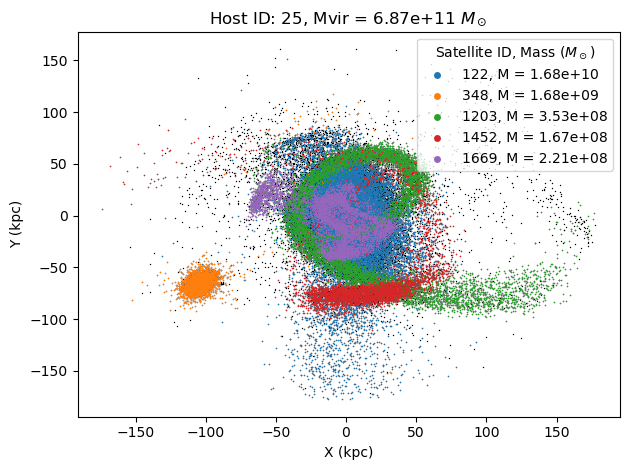

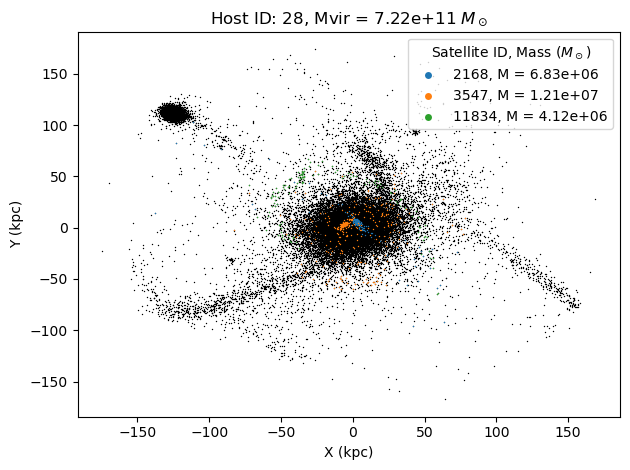

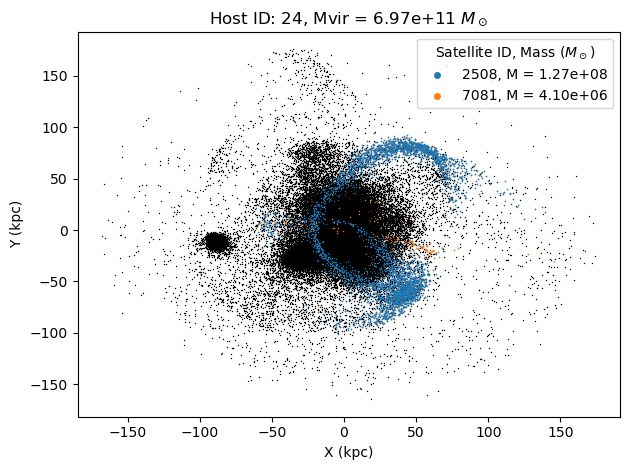

In [12]:
from decimal import Decimal
plt.style.use('default')
for j,sat_group in enumerate(sats): #j 0,1,2
    for i,sat_object in enumerate(sat_group):
        x = hosts[j]['stellar_x'][:][indices[j][i]]
        y = hosts[j]['stellar_y'][:][indices[j][i]]
        plt.scatter(x,y, label = str(sat_obj_ids[j][i]) + str(", M = " + str('{:.2e}'.format((round(sat_masses[j][i], 5))))), s=1, linewidths=0, zorder = 2)
    plt.scatter(hosts[j]['stellar_x'][::1], hosts[j]['stellar_y'][::1], color = 'black',s=1,zorder=-1, linewidths=0)
    plt.xlabel("X (kpc)")
    plt.ylabel("Y (kpc)")
    plt.legend(title = "Satellite ID, Mass ($M_\odot$)", markerscale=5, loc='upper right')
    plt.title("Host ID: " + str(host_ids[j]) + str(", Mvir = " + str('{:.2e}'.format((round(host_masses[j], 5))))) + " $M_\odot$")
    plt.tight_layout()
    plt.savefig("./satellite_streams_host_" + str(host_ids[j]) + ".pdf", dpi=100)
    plt.show((6,6))

<>:12: SyntaxWarning: invalid escape sequence '\o'
<>:13: SyntaxWarning: invalid escape sequence '\o'
<>:12: SyntaxWarning: invalid escape sequence '\o'
<>:13: SyntaxWarning: invalid escape sequence '\o'
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_29705/2480377742.py:12: SyntaxWarning: invalid escape sequence '\o'
  plt.legend(title = "Satellite ID, Mass ($M_\odot$)", markerscale=5, loc='upper right')
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_29705/2480377742.py:13: SyntaxWarning: invalid escape sequence '\o'
  plt.title("Host ID: " + str(host_ids[j]) + str(", log(Mvir) = " + str(round(np.log10(host_masses[j]), 1))) + " $M_\odot$")


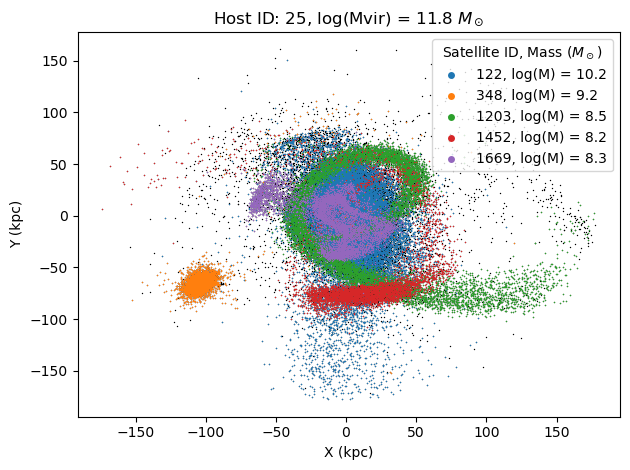

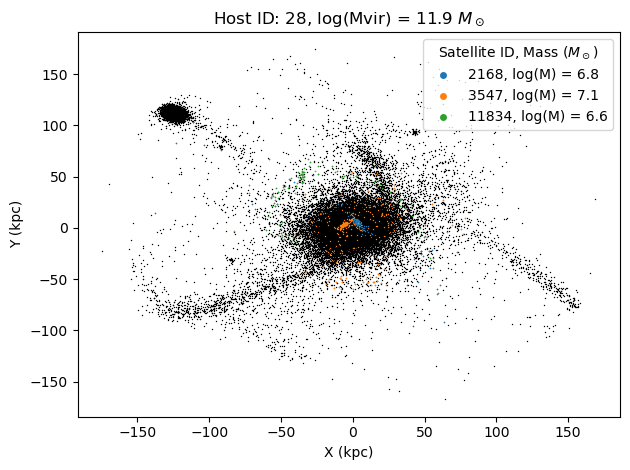

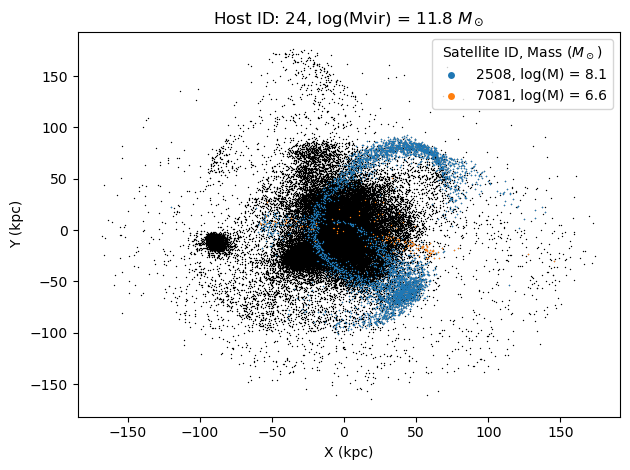

In [13]:
from decimal import Decimal
plt.style.use('default')

for j,sat_group in enumerate(sats): #j 0,1,2
    for i,sat_object in enumerate(sat_group):
        x = hosts[j]['stellar_x'][:][indices[j][i]]
        y = hosts[j]['stellar_y'][:][indices[j][i]]
        plt.scatter(x,y, label = str(sat_obj_ids[j][i]) + str(", log(M) = " + str(round(np.log10(sat_masses[j][i]), 1))), s=1, linewidths=0, zorder = 2)
    plt.scatter(hosts[j]['stellar_x'][::1], hosts[j]['stellar_y'][::1], color = 'black',s=1,zorder=-1, linewidths=0)
    plt.xlabel("X (kpc)")
    plt.ylabel("Y (kpc)")
    plt.legend(title = "Satellite ID, Mass ($M_\odot$)", markerscale=5, loc='upper right')
    plt.title("Host ID: " + str(host_ids[j]) + str(", log(Mvir) = " + str(round(np.log10(host_masses[j]), 1))) + " $M_\odot$")
    plt.tight_layout()
    plt.savefig("./satellite_streams_host_log_" + str(host_ids[j]) + ".pdf", dpi=100)
    plt.show((6,6))

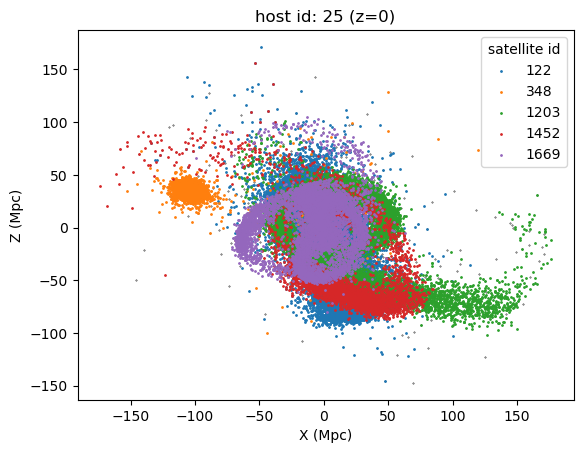

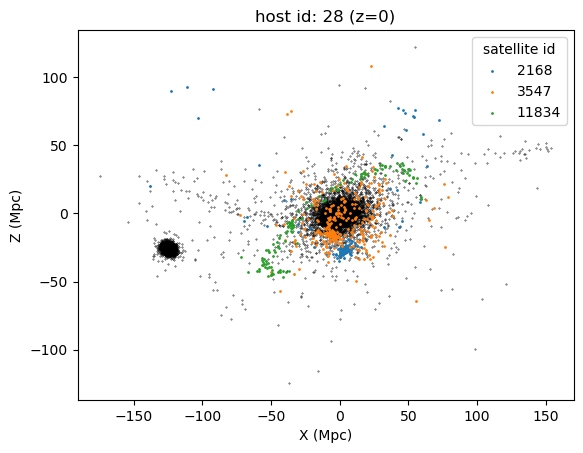

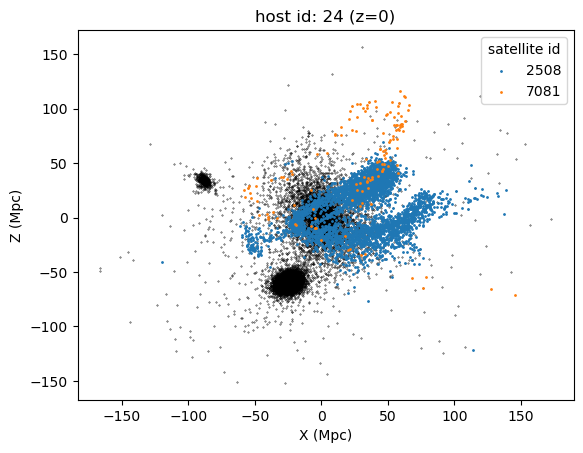

In [ ]:
# not_indices = ~indices[j][i]
for j,sat_group in enumerate(sats): #j 0,1,2
    for i,sat_object in enumerate(sat_group):
        x = hosts[j]['stellar_x'][:][indices[j][i]]
        y = hosts[j]['stellar_y'][:][indices[j][i]]
        z = hosts[j]['stellar_z'][:][indices[j][i]]
        plt.scatter(x,z,label = sat_obj_ids[j][i], s=1)
    plt.scatter(hosts[j]['stellar_x'][::10], hosts[j]['stellar_z'][::10], color = 'black',s=0.1,zorder=-1)
    plt.xlabel("X (Mpc)")
    plt.ylabel("Z (Mpc)")
    plt.legend(title = "satellite id")
    plt.title("host id: " + str(host_ids[j]) + str(" (z=0)"))
    plt.show()

In [ ]:
sats[0]

[<HDF5 file "particles_within_Rvir_object_122.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_348.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_1203.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_1452.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_1669.hdf5" (mode r)>]

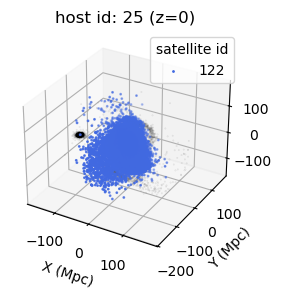

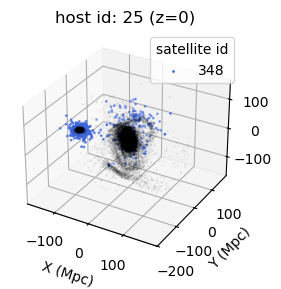

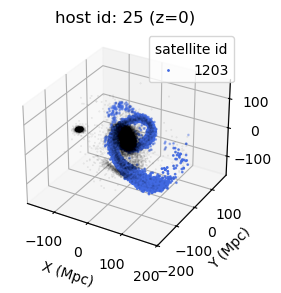

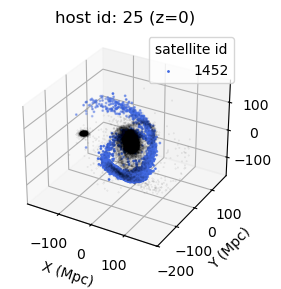

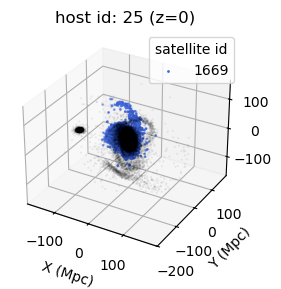

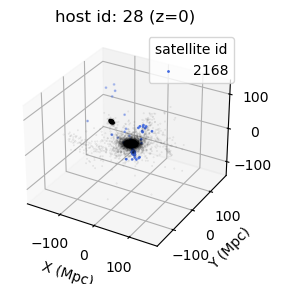

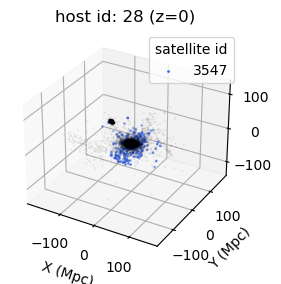

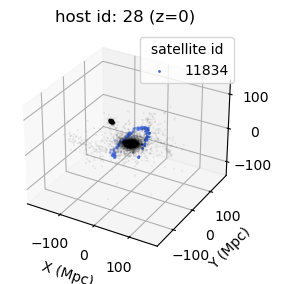

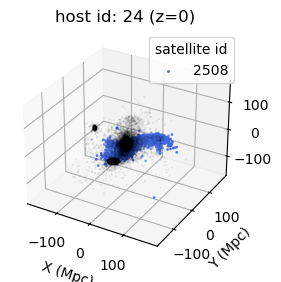

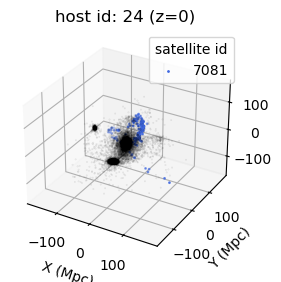

In [ ]:
for j,sat_group in enumerate(sats): #j 0,1,2
    for i,sat_object in enumerate(sat_group):
        fig, ax = plt.subplots(figsize = (3,3),subplot_kw={"projection": "3d"}, dpi = 100)
        ax.scatter(hosts[j]['stellar_x'][::10],hosts[j]['stellar_y'][::10], hosts[j]['stellar_z'][::10], color = 'black',s=0.1, alpha = 0.1)
        x = hosts[j]['stellar_x'][:][indices[j][i]]
        y = hosts[j]['stellar_y'][:][indices[j][i]]
        z = hosts[j]['stellar_z'][:][indices[j][i]]
        ax.scatter(x,y,z,label = sat_obj_ids[j][i], s=1, c='royalblue')
        ax.set_xlabel("X (Mpc)")
        ax.set_ylabel("Y (Mpc)")
        ax.legend(title = "satellite id")
        ax.set_title("host id: " + str(host_ids[j]) + str(" (z=0)"))
        plt.show()

/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_29209/1088862566.py:42: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


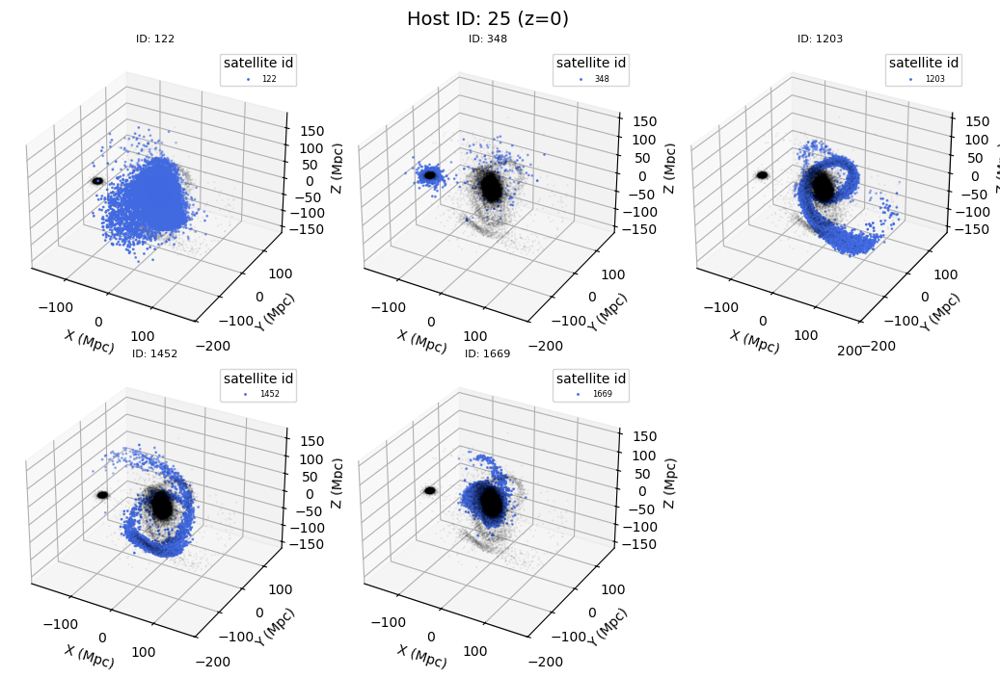

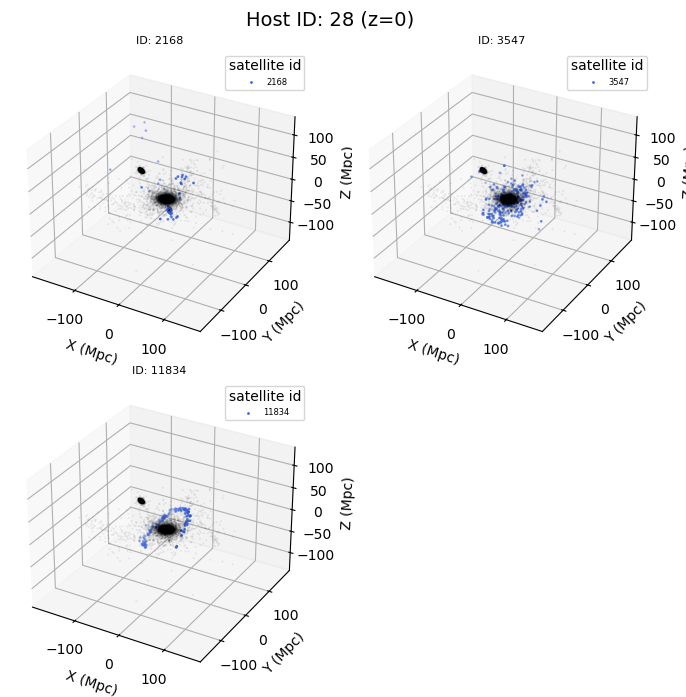

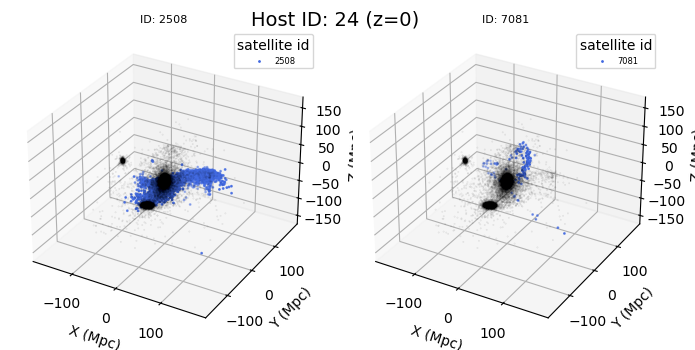

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Not necessary in newer matplotlib but kept for clarity
import numpy as np

for j, sat_group in enumerate(sats):  # j = 0,1,2
    num_sats = len(sat_group)
    
    # Determine grid size
    ncols = int(np.ceil(np.sqrt(num_sats)))
    nrows = int(np.ceil(num_sats / ncols))
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                             figsize=(ncols * 3.5, nrows * 3.5),
                             subplot_kw={"projection": "3d"},
                             dpi=100)
    axes = np.array(axes).reshape(-1)  # Flatten in case of 2D grid
    
    for i, sat_object in enumerate(sat_group):
        ax = axes[i]
        # Background stars
        ax.scatter(hosts[j]['stellar_x'][::10],
                   hosts[j]['stellar_y'][::10],
                   hosts[j]['stellar_z'][::10],
                   color='black', s=0.1, alpha=0.1)
        # Stream
        x = hosts[j]['stellar_x'][:][indices[j][i]]
        y = hosts[j]['stellar_y'][:][indices[j][i]]
        z = hosts[j]['stellar_z'][:][indices[j][i]]
        ax.scatter(x, y, z, label=sat_obj_ids[j][i], s=1, c='royalblue')
        
        ax.set_xlabel("X (Mpc)")
        ax.set_ylabel("Y (Mpc)")
        ax.set_zlabel("Z (Mpc)")
        ax.set_title(f"ID: {sat_obj_ids[j][i]}", fontsize=8)
        ax.legend(fontsize=6, title="satellite id")
    
    # Hide unused subplots
    for k in range(i + 1, len(axes)):
        fig.delaxes(axes[k])

    fig.suptitle(f"Host ID: {host_ids[j]} (z=0)", fontsize=14)
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()


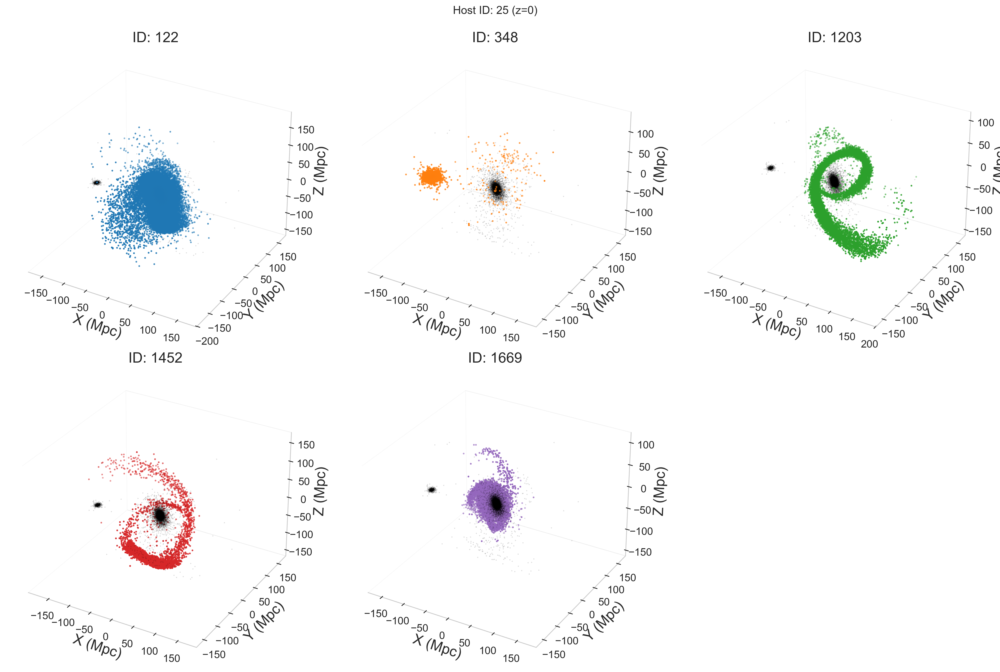

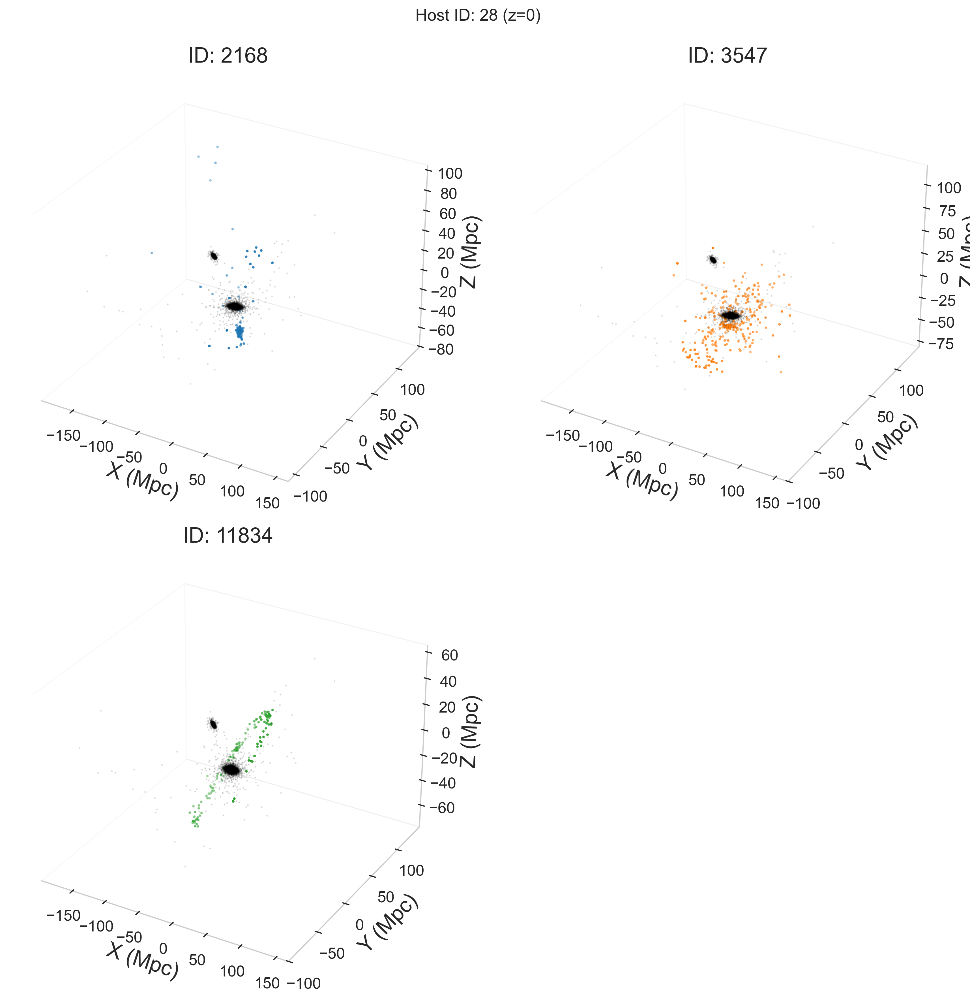

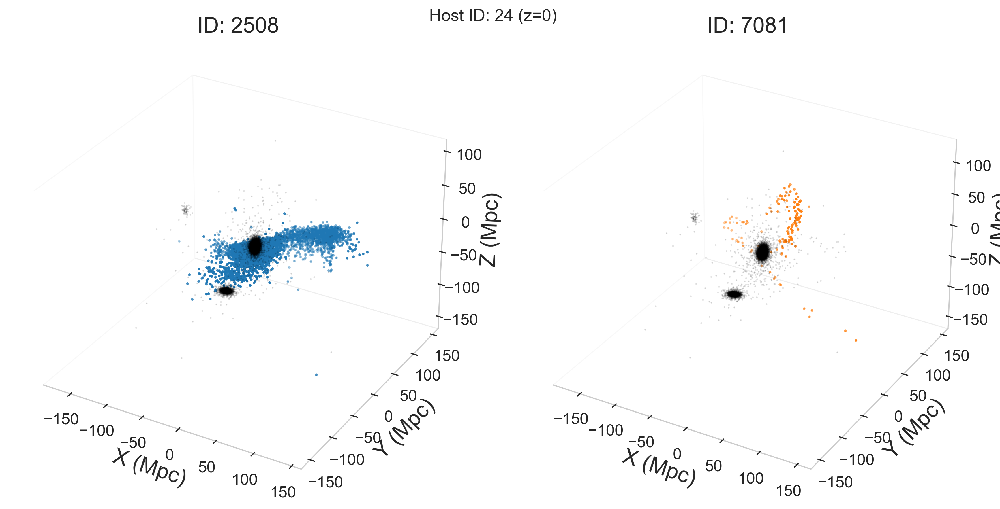

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

# Use seaborn for a cleaner, publication-ready style
sns.set_context("paper", font_scale=1.5)
sns.set_style("whitegrid")

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

font_size = 18

for j, sat_group in enumerate(sats):  # j = 0, 1, 2
    num_sats = len(sat_group)
    
    # Determine grid size
    ncols = int(np.ceil(np.sqrt(num_sats)))
    nrows = int(np.ceil(num_sats / ncols))
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                             figsize=(ncols * 6, nrows * 6),
                             subplot_kw={"projection": "3d"},
                             dpi=300)
    axes = np.array(axes).reshape(-1)  # Flatten in case of 2D grid
    
    for i, sat_object in enumerate(sat_group):
        ax = axes[i]
        
        # Plot background stars first (black dots)
        ax.scatter(hosts[j]['stellar_x'][::100],
                   hosts[j]['stellar_y'][::100],
                   hosts[j]['stellar_z'][::100],
                   color='black', s=0.5, alpha=0.1)
        
        # Plot stream (blue dots) over background stars
        x = hosts[j]['stellar_x'][:][indices[j][i]]
        y = hosts[j]['stellar_y'][:][indices[j][i]]
        z = hosts[j]['stellar_z'][:][indices[j][i]]
        ax.scatter(x, y, z, label=sat_obj_ids[j][i], s=2, color=colors[i % len(colors)]) #c='royalblue'
        
        # Label the axes
        ax.set_xlabel("X (Mpc)", fontsize=font_size)
        ax.set_ylabel("Y (Mpc)", fontsize=font_size)
        ax.set_zlabel("Z (Mpc)", fontsize=font_size)
        
        # Title and legend with adjusted font sizes
        ax.set_title(f"ID: {sat_obj_ids[j][i]}", fontsize=font_size)
        # ax.legend(fontsize=font_size, title="Satellite ID")
        
        # Customizing appearance (removing unnecessary spines)
        ax.xaxis.pane.fill = False  # Remove background pane
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False
        ax.grid(False)  # Disable grid for cleaner appearance
        
    # Hide unused subplots
    for k in range(i + 1, len(axes)):
        fig.delaxes(axes[k])

    # Title for the entire figure
    fig.suptitle(f"Host ID: {host_ids[j]} (z=0)", fontsize=14)
    
    
    # Tight layout and adjustments to avoid overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)

    # Show the plot
    plt.show()

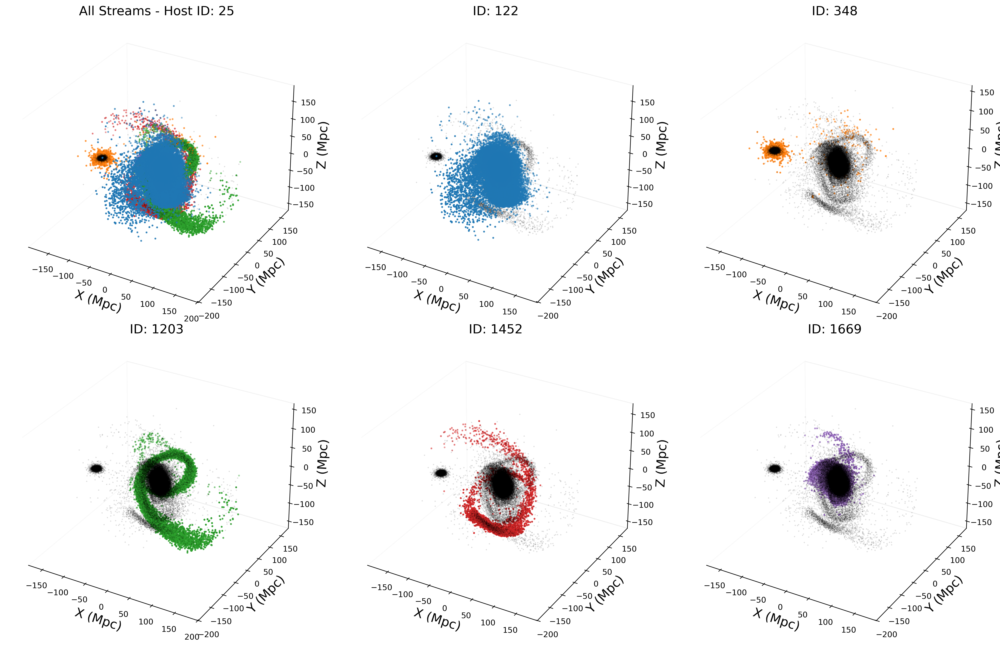

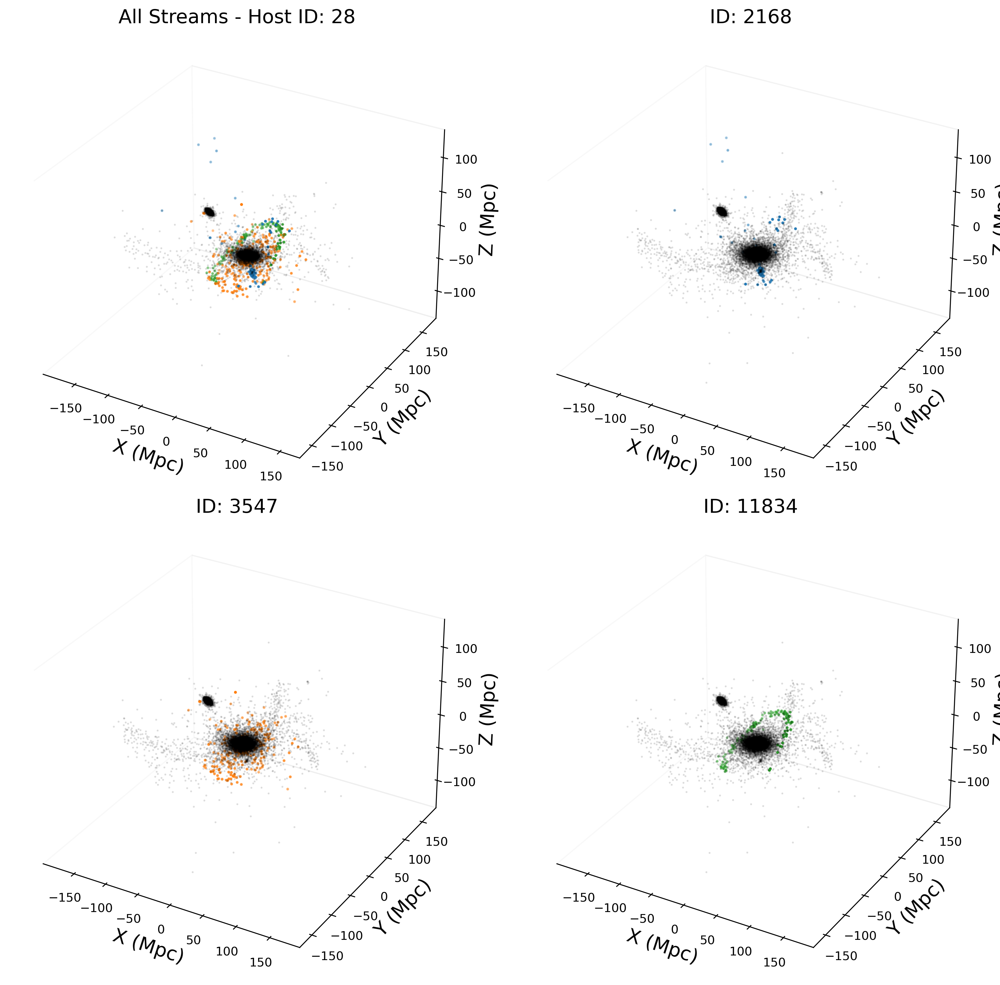

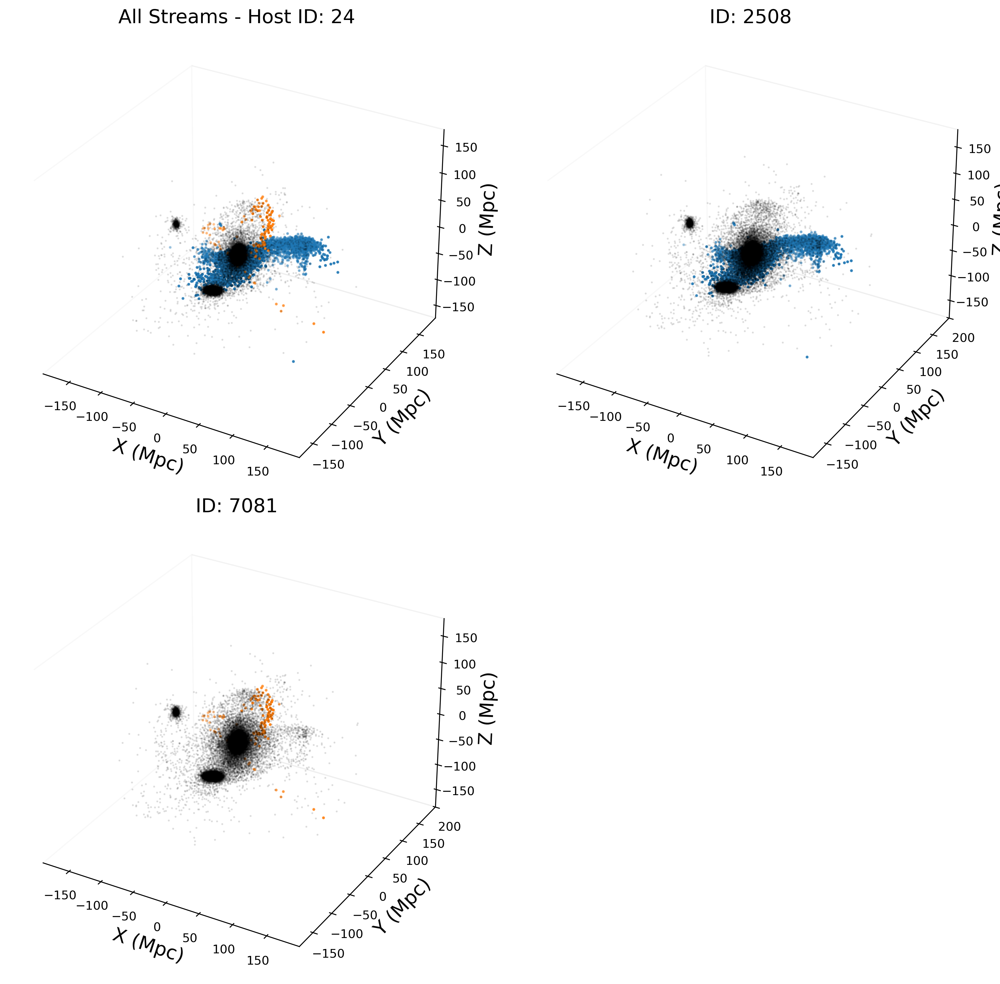

In [ ]:
# Use seaborn for a cleaner, publication-ready style

# sns.set_context("paper", font_scale=1.5)
# sns.set_style("whitegrid")

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

font_size = 16

for j, sat_group in enumerate(sats):  # j = 0, 1, 2
    num_sats = len(sat_group)

    ncols = int(np.ceil(np.sqrt(num_sats + 1)))  # +1 for combined plot
    nrows = int(np.ceil((num_sats + 1) / ncols))

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                             figsize=(ncols * 6, nrows * 6),
                             subplot_kw={"projection": "3d"},
                             dpi=300)
    axes = np.array(axes).reshape(-1)

    # === Combined Plot (first axis) ===
    ax_combined = axes[0]
    ax_combined.scatter(hosts[j]['stellar_x'][::10],
                        hosts[j]['stellar_y'][::10],
                        hosts[j]['stellar_z'][::10],
                        color='black', s=0.5, alpha=0.1)

    for i, sat_object in enumerate(sat_group):
        color = colors[i % len(colors)]
        x = hosts[j]['stellar_x'][:][indices[j][i]]
        y = hosts[j]['stellar_y'][:][indices[j][i]]
        z = hosts[j]['stellar_z'][:][indices[j][i]]

        ax_combined.scatter(x, y, z, s=2, color=color)
        # ax_combined.text(np.mean(x), np.mean(y), np.mean(z),
        #                  sat_obj_ids[j][i], fontsize=8, color=color)

    ax_combined.set_title(f"All Streams - Host ID: {host_ids[j]}", fontsize=font_size)
    ax_combined.set_xlabel("X (Mpc)", fontsize=font_size)
    ax_combined.set_ylabel("Y (Mpc)", fontsize=font_size)
    ax_combined.set_zlabel("Z (Mpc)", fontsize=font_size)
    ax_combined.xaxis.pane.fill = False
    ax_combined.yaxis.pane.fill = False
    ax_combined.zaxis.pane.fill = False
    ax_combined.grid(False)

    # === Individual Stream Subplots ===
    for i, sat_object in enumerate(sat_group):
        ax = axes[i + 1]  # shift by +1 to skip combined plot
        color = colors[i % len(colors)]
        x = hosts[j]['stellar_x'][:][indices[j][i]]
        y = hosts[j]['stellar_y'][:][indices[j][i]]
        z = hosts[j]['stellar_z'][:][indices[j][i]]

        ax.scatter(hosts[j]['stellar_x'][::5],
                   hosts[j]['stellar_y'][::5],
                   hosts[j]['stellar_z'][::5],
                   color='black', s=0.5, alpha=0.1)
        ax.scatter(x, y, z, color=color, s=2)
        # ax.text(np.mean(x), np.mean(y), np.mean(z),
        #         sat_obj_ids[j][i], fontsize=8, color=color)

        ax.set_xlabel("X (Mpc)", fontsize=font_size)
        ax.set_ylabel("Y (Mpc)", fontsize=font_size)
        ax.set_zlabel("Z (Mpc)", fontsize=font_size)
        ax.set_title(f"ID: {sat_obj_ids[j][i]}", fontsize=font_size)
        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False
        ax.grid(False)

    # Hide unused subplots
    for k in range(num_sats + 1, len(axes)):
        fig.delaxes(axes[k])

    # fig.suptitle(f"Host ID: {host_ids[j]} (z=0)", fontsize=20)
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    
    plt.savefig(f"./GTGRID-HostID{host_ids[j]}.jpg", dpi=300)
    plt.show()

In [ ]:
# colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
# font_size = 16

# for j, sat_group in enumerate(sats):  # j = 0, 1, 2
#     num_sats = len(sat_group)

#     ncols = int(np.ceil(np.sqrt(num_sats + 1)))  # +1 for combined plot
#     nrows = int(np.ceil((num_sats + 1) / ncols))

#     fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
#                              figsize=(ncols * 5, nrows * 5),
#                              dpi=300)
#     axes = np.array(axes).flatten()

#     # === Combined Plot (first axis) ===
#     ax_combined = axes[0]
#     ax_combined.scatter(hosts[j]['stellar_x'][::10],
#                         hosts[j]['stellar_y'][::10],
#                         color='black', s=0.5, alpha=0.1)

#     for i, sat_object in enumerate(sat_group):
#         color = colors[i % len(colors)]
#         x = hosts[j]['stellar_x'][indices[j][i]]
#         y = hosts[j]['stellar_y'][indices[j][i]]

#         ax_combined.scatter(x, y, s=2, color=color)
#         # ax_combined.text(np.mean(x), np.mean(y), sat_obj_ids[j][i], fontsize=8, color=color)

#     ax_combined.set_title(f"All Streams - Host ID: {host_ids[j]}", fontsize=font_size)
#     ax_combined.set_xlabel("X (Mpc)", fontsize=font_size)
#     ax_combined.set_ylabel("Y (Mpc)", fontsize=font_size)

#     # === Individual Stream Subplots ===
#     for i, sat_object in enumerate(sat_group):
#         ax = axes[i + 1]
#         color = colors[i % len(colors)]
#         x = hosts[j]['stellar_x'][indices[j][i]]
#         y = hosts[j]['stellar_y'][indices[j][i]]

#         ax.scatter(hosts[j]['stellar_x'][::5],
#                    hosts[j]['stellar_y'][::5],
#                    color='black', s=0.5, alpha=0.1)
#         ax.scatter(x, y, color=color, s=2)
#         # ax.text(np.mean(x), np.mean(y), sat_obj_ids[j][i], fontsize=8, color=color)

#         ax.set_xlabel("X (Mpc)", fontsize=font_size)
#         ax.set_ylabel("Y (Mpc)", fontsize=font_size)
#         ax.set_title(f"ID: {sat_obj_ids[j][i]}", fontsize=font_size)

#     # Hide unused subplots
#     for k in range(num_sats + 1, len(axes)):
#         fig.delaxes(axes[k])

#     plt.tight_layout()
#     plt.subplots_adjust(top=0.92)
#     plt.savefig(f"./GTGRID2D-HostID{host_ids[j]}.jpg", dpi=300)
#     plt.show()

In [ ]:
# import numpy as np
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# import matplotlib.pyplot as plt

# colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

# for j, sat_group in enumerate(sats):
#     num_sats = len(sat_group)
#     total_plots = num_sats + 1  # +1 for combined plot

#     ncols = int(np.ceil(np.sqrt(total_plots)))
#     nrows = int(np.ceil(total_plots / ncols))

#     fig = make_subplots(
#         rows=nrows, cols=ncols,
#         specs=[[{'type': 'scene'}] * ncols for _ in range(nrows)],
#         subplot_titles=["All Streams"] + [f"ID: {sid}" for sid in sat_obj_ids[j]]
#     )

#     # === Combined Plot ===
#     row, col = divmod(0, ncols)
#     # Background
#     fig.add_trace(
#         go.Scatter3d(
#             x=hosts[j]['stellar_x'][::100],
#             y=hosts[j]['stellar_y'][::100],
#             z=hosts[j]['stellar_z'][::100],
#             mode='markers',
#             marker=dict(size=1, color='black', opacity=0.05),
#             name='Background'
#         ),
#         row=row+1, col=col+1
#     )

#     for i, sat_object in enumerate(sat_group):
#         color = colors[i % len(colors)]
#         x = hosts[j]['stellar_x'][indices[j][i]]
#         y = hosts[j]['stellar_y'][indices[j][i]]
#         z = hosts[j]['stellar_z'][indices[j][i]]

#         # Add to combined
#         fig.add_trace(
#             go.Scatter3d(
#                 x=x, y=y, z=z,
#                 mode='markers',
#                 marker=dict(size=2, color=color),
#                 name=f"ID {sat_obj_ids[j][i]}",
#                 showlegend=False,
#                 text=[f"ID: {sat_obj_ids[j][i]}"] * len(x),
#                 hoverinfo='text'
#             ),
#             row=1, col=1
#         )

#         # Add individual subplot
#         row, col = divmod(i + 1, ncols)
#         # Background
#         fig.add_trace(
#             go.Scatter3d(
#                 x=hosts[j]['stellar_x'][::100],
#                 y=hosts[j]['stellar_y'][::100],
#                 z=hosts[j]['stellar_z'][::100],
#                 mode='markers',
#                 marker=dict(size=1, color='black', opacity=0.05),
#                 showlegend=False
#             ),
#             row=row+1, col=col+1
#         )

#         fig.add_trace(
#             go.Scatter3d(
#                 x=x, y=y, z=z,
#                 mode='markers+text',
#                 marker=dict(size=2, color=color),
#                 text=[sat_obj_ids[j][i]] * len(x),
#                 textposition="top center",
#                 hoverinfo='text',
#                 showlegend=False
#             ),
#             row=row+1, col=col+1
#         )

#     fig.update_layout(
#         height=300 * nrows, width=300 * ncols,
#         title_text=f"Interactive Streams - Host ID: {host_ids[j]} (z=0)",
#         showlegend=False,
#         margin=dict(t=50, l=0, r=0, b=0)
#     )

#     fig.show()


In [ ]:
sats[0]

[<HDF5 file "particles_within_Rvir_object_122.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_348.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_1203.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_1452.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_1669.hdf5" (mode r)>]

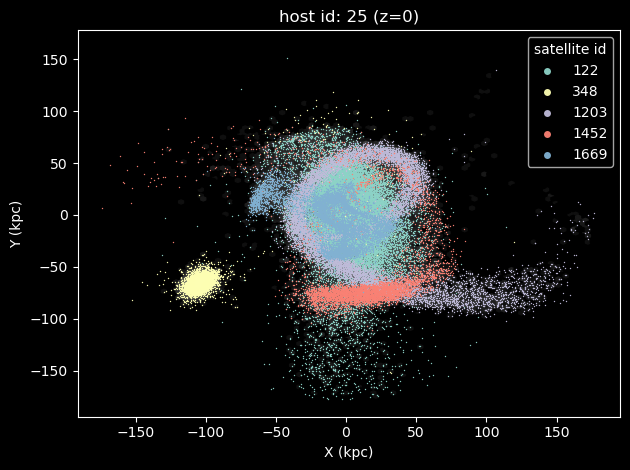

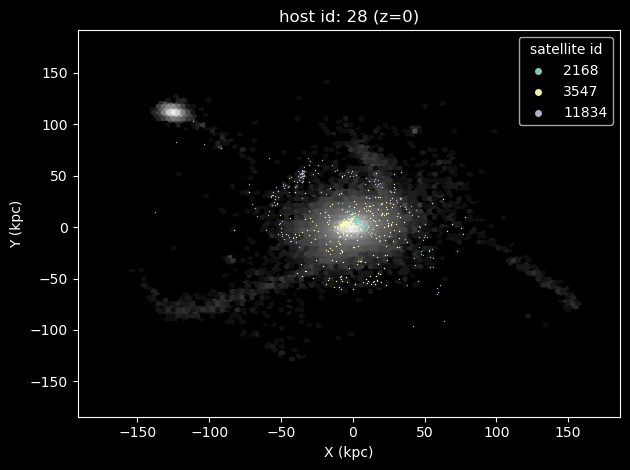

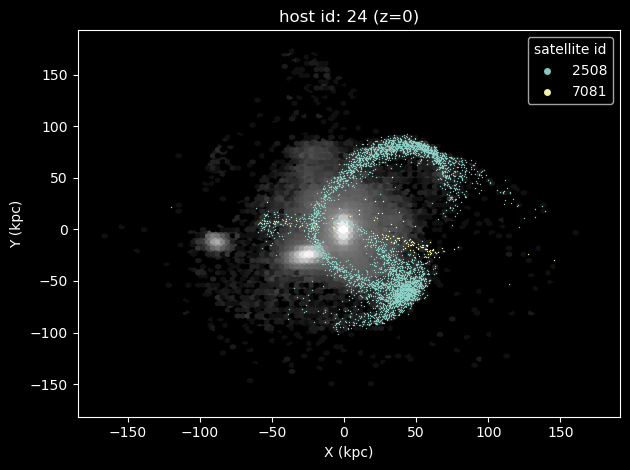

In [ ]:

plt.style.use('dark_background')
for j,sat_group in enumerate(sats): #j 0,1,2
    for i,sat_object in enumerate(sat_group):
        x = hosts[j]['stellar_x'][:][indices[j][i]]
        y = hosts[j]['stellar_y'][:][indices[j][i]]

        plt.scatter(x,y, label = str(sat_obj_ids[j][i]), s=1, linewidths=0, zorder = 2, alpha = 0.95)
    plt.hexbin(hosts[j]['stellar_x'][::1], hosts[j]['stellar_y'][::1], cmap = "Greys_r", bins='log', gridsize=100)
    plt.xlabel("X (kpc)")
    plt.ylabel("Y (kpc)")
    plt.legend(title = "satellite id", markerscale=5, loc='upper right')
    plt.title("host id: " + str(host_ids[j]) + str(" (z=0)"))
    plt.tight_layout()
    plt.savefig("./satellite_streams_host_dark" + str(host_ids[j]) + ".png", dpi = 500)
    plt.show((6,6))

In [ ]:
hosts[0]['stellar_tform'][:]

array([0.37289539, 0.58744293, 0.65436018, ..., 0.69020998, 0.56140679,
       0.72048587])

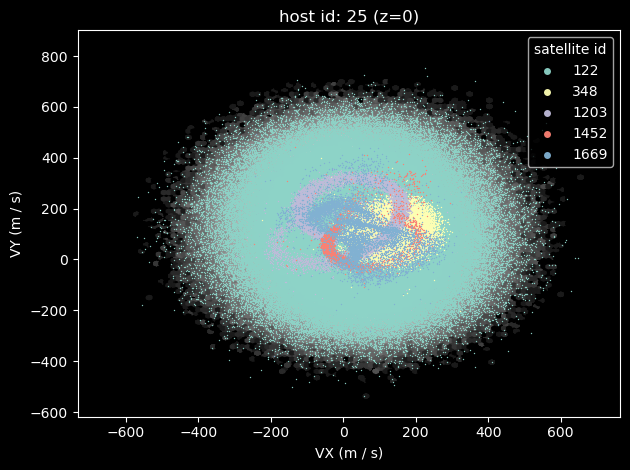

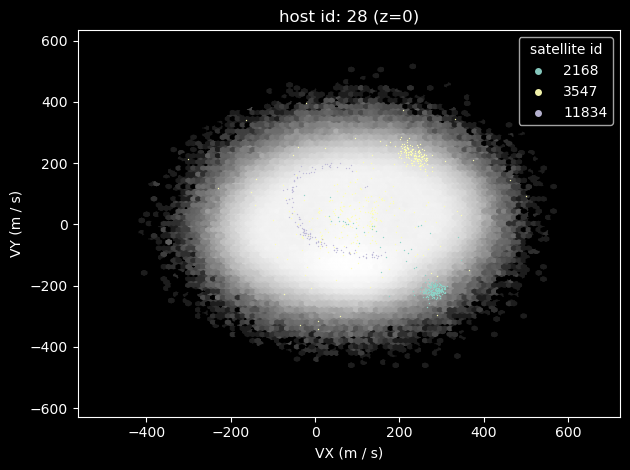

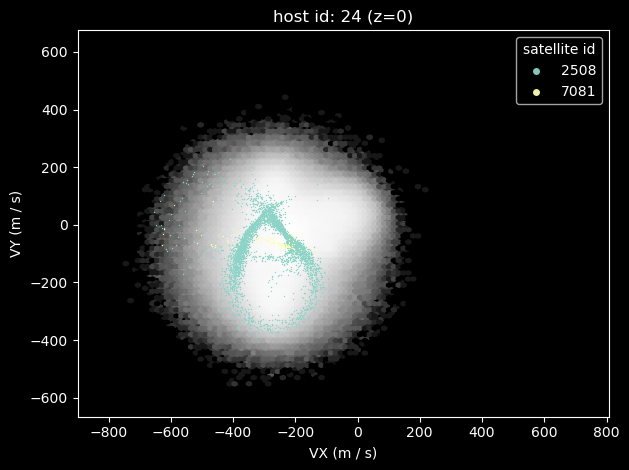

In [ ]:
plt.style.use('dark_background')
for j,sat_group in enumerate(sats): #j 0,1,2
    for i,sat_object in enumerate(sat_group):
        x = hosts[j]['stellar_vx'][:][indices[j][i]]
        y = hosts[j]['stellar_vy'][:][indices[j][i]]
        
        plt.scatter(x,y, label = str(sat_obj_ids[j][i]), s=1, linewidths=0, zorder = 2, alpha = 0.95)
        plt.hexbin(hosts[j]['stellar_vx'][:], hosts[j]['stellar_vy'][:], cmap = "Greys_r", bins='log', gridsize=100)
    # plt.hexbin(hosts[j]['stellar_x'][::1], hosts[j]['stellar_y'][::1], cmap = "Greys_r", bins='log', gridsize=100)
    plt.xlabel("VX (m / s)")
    plt.ylabel("VY (m / s)")
    plt.legend(title = "satellite id", markerscale=5, loc='upper right')
    plt.title("host id: " + str(host_ids[j]) + str(" (z=0)"))
    plt.tight_layout()
    # plt.savefig("./satellite_streams_host_dark" + str(host_ids[j]) + ".png", dpi = 500)
    plt.show((6,6))

In [ ]:
#game plan: show these labels 

# jp, jr, jz = copy.deepcopy(sat_obj_ids)

# for j,sat_group in enumerate(sats): #j 0,1,2
#     for i,sat_object in enumerate(sat_group):
#         print(j, i, len(matching_ids[j][i]))
#         jp[j][i] = hosts[j]['stellar_x'][:][indices[j][i]]
#         jr[j][i] = hosts[j]['stellar_y'][:][indices[j][i]]
#         jz[j][i] = hosts[j]['stellar_z'][:][indices[j][i]]

In [ ]:
# print([key for key in imported_data.keys()])

In [ ]:
# plt.style.use('default')

# imported_data = np.load('/Users/benjaminhanf/Desktop/pomona_s25/thesis/pipeline/to_green_planet/25/25/savez_arrays_25.npz')

# print(imported_data['x'])

# jp, jr, jz = imported_data['jp'], imported_data['jr'], imported_data['jz']

# imported_data['pos_mask']

# for j,sat_group in enumerate(sats[0]): #j 0,1,2
#     for i,sat_object in enumerate(sat_group):
#         x = hosts[j]['stellar_vx'][:][indices[j][i]]
        
#         y = hosts[j]['stellar_vy'][:][indices[j][i]]
        
#         plt.scatter(x,y, label = str(sat_obj_ids[j][i]), s=1, linewidths=0, zorder = 2, alpha = 0.95)
#         plt.hexbin(hosts[j]['stellar_vx'][:], hosts[j]['stellar_vy'][:], cmap = "Greys_r", bins='log', gridsize=100)
#     # plt.hexbin(hosts[j]['stellar_x'][::1], hosts[j]['stellar_y'][::1], cmap = "Greys_r", bins='log', gridsize=100)
#     plt.xlabel("VX (m / s)")
#     plt.ylabel("VY (m / s)")
#     plt.legend(title = "satellite id", markerscale=5, loc='upper right')
#     plt.title("host id: " + str(host_ids[j]) + str(" (z=0)"))
#     plt.tight_layout()
#     # plt.savefig("./satellite_streams_host_dark" + str(host_ids[j]) + ".png", dpi = 500)
#     plt.show((6,6))

In [ ]:
hosts[0]['stellar_id']

<HDF5 dataset "stellar_id": shape (1988031,), type "<f8">

In [ ]:
# for j,sat_group in enumerate(sats): #j 0,1,2
#     print(str(host_ids[j]) + ":")
#     for i,sat_object in enumerate(sat_group): # individual satellites for each host
#         x = (sat_object['stellar_x'] + np.asarray(sat_object['Xc']))[::1]
#         y = (sat_object['stellar_y'] + np.asarray(sat_object['Yc']))[::1]
#         plt.scatter(x,y,label = str(sat_obj_ids[j][i]))
#     plt.title(str(host_ids[j]))
#     plt.legend()
#     plt.show()

In [ ]:
#compare to clusters

# Load
with open('/Users/benjaminhanf/Desktop/pomona_s25/thesis/pipeline/labels_dict_1_jrjzjp.pkl', 'rb') as f:
    labels_dict = pickle.load(f)

In [ ]:
# Load
with open('/Users/benjaminhanf/Desktop/pomona_s25/thesis/pipeline/masked_ids.pkl', 'rb') as g:
    masked_ids = pickle.load(g)

In [ ]:
print(len(labels_dict['24']), len(masked_ids[2]))
print(len(labels_dict['25']), len(masked_ids[0]))
print(len(labels_dict['28']), len(masked_ids[1]))

467382 467382
238045 238045
32187 32187


In [ ]:
# unique_labels = set(labels_dict['25'])

# for label in unique_labels:
    

In [ ]:
len(masked_ids[0])

238045

In [ ]:
len(labels_dict['25'])

238045

In [ ]:
# unique_labels = set(labels_dict['25'])
# labels = labels_dict['25']

# # mask = np.isin(hosts[0]['stellar_id'], masked_ids[0])
# mask = np.isin(hosts[0]['stellar_id'], np.unique(masked_ids[0]))


# # Get labels corresponding to unique_ids only
# # If labels_dict['25'] is aligned with masked_ids[0], then:
# id_to_label = dict(zip(masked_ids[0], labels_dict['25']))

# # Now align labels with x/y (which are built from unique_ids)
# labels = np.array([id_to_label[uid] for uid in np.unique(masked_ids[0])])


# print(len(mask))

# x=hosts[0]['stellar_x'][mask]
# y=hosts[0]['stellar_y'][mask]

# #force fix 

# print(len(labels), len(x)) #mismatched- maybe an error from action finding ...


# fig = plt.figure(figsize=(8, 6))
# for i in unique_labels:
#     if sum(np.isin(labels, i)) < 200_000 and i!= -1:
#         # Scatter plot
#         # plt.scatter(x[labels != i], y[labels != i], c='grey', alpha=0.1, s=3.9, label='Other')
#         plt.scatter(x[labels == i], y[labels == i], s=3, label=f'Label {i}', linewidths=0)
#         plt.title(f'Stream {i}')
#         plt.xlabel('X')
#         plt.ylabel('Y')

239759


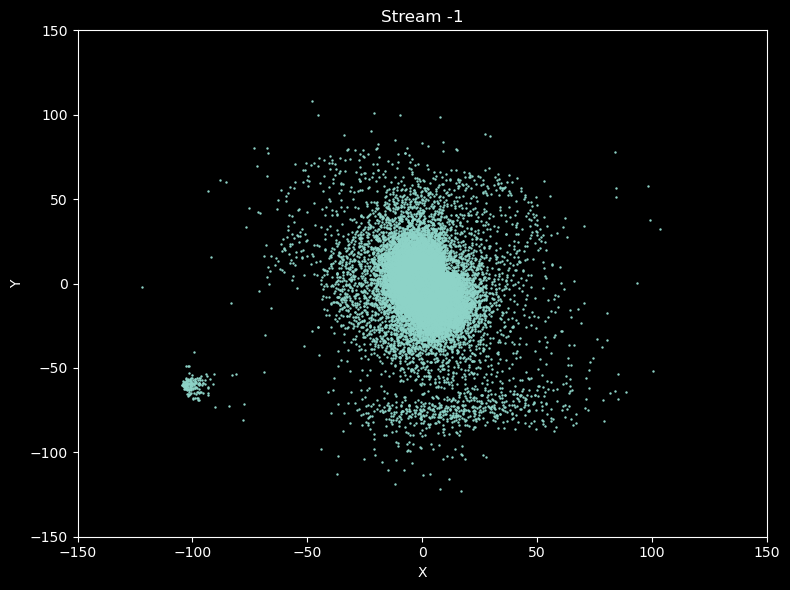

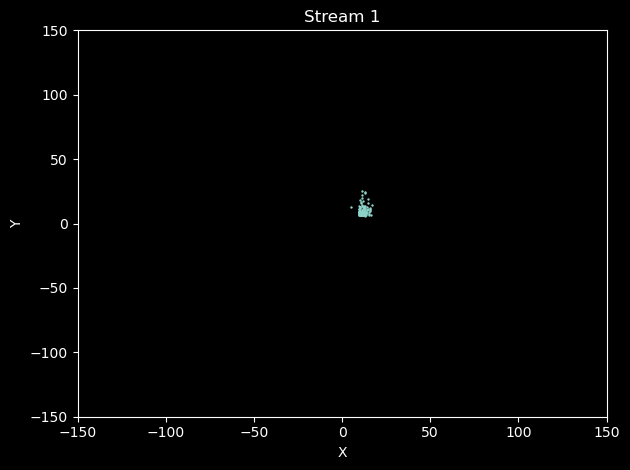

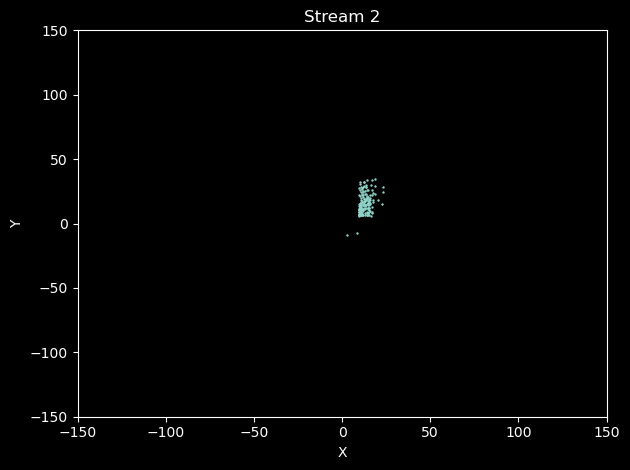

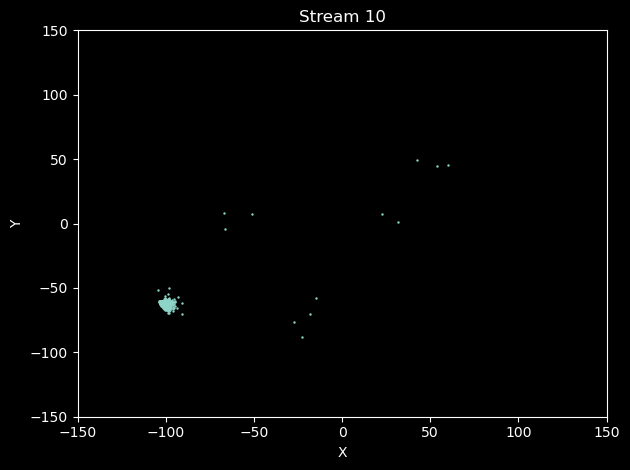

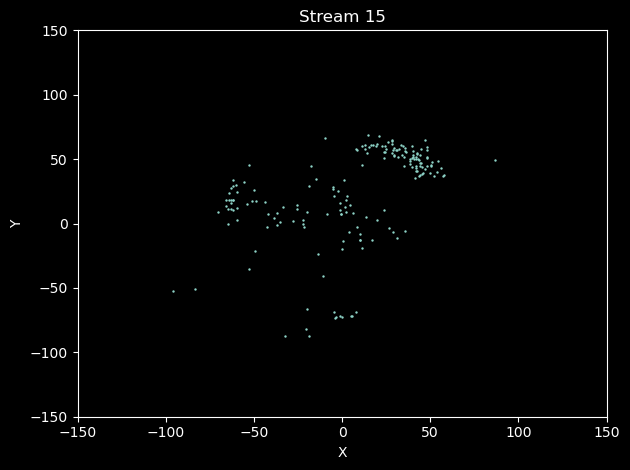

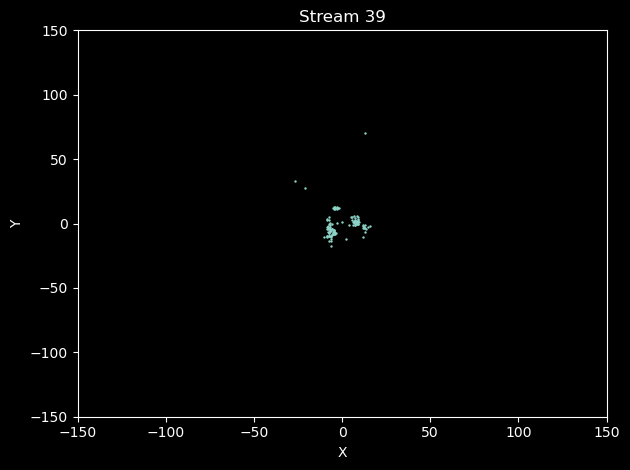

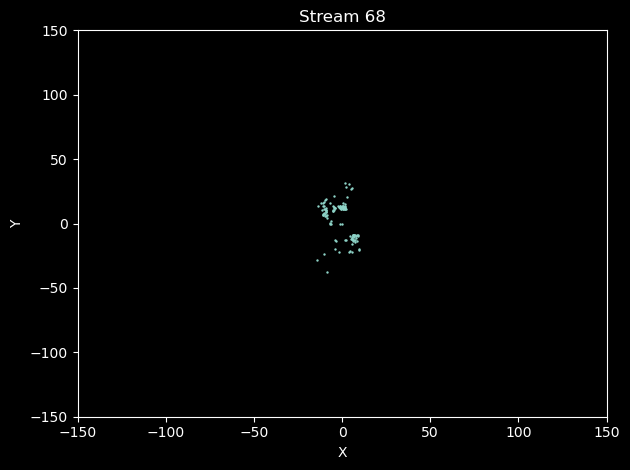

In [ ]:
import pandas as pd

# 1. Build DataFrame from host data
host_df = pd.DataFrame({
    'stellar_id': hosts[0]['stellar_id'],
    'x': hosts[0]['stellar_x'],
    'y': hosts[0]['stellar_y']
})

# 2. Create label DataFrame
label_df = pd.DataFrame({
    'stellar_id': masked_ids[0],
    'label': labels_dict['25']
})

# 3. Drop duplicates (if needed) — because duplicate stellar_ids break the merge
label_df = label_df.drop_duplicates(subset='stellar_id')

# 4. Merge on 'stellar_id'
merged = host_df.merge(label_df, on='stellar_id', how='inner')

print(len(merged))  # Should match number of labeled + matched stars

# 5. Plot
fig = plt.figure(figsize=(8, 6))
for i in sorted(merged['label'].unique()):
    if (merged['label'] == i).sum() < 200_000 and (merged['label'] == i).sum() > 100:
        subset = merged[merged['label'] == i]
        plt.scatter(subset['x'], subset['y'], s=3, label=f'Label {i}', linewidths=0)
        plt.title(f'Stream {i}')
        plt.xlabel('X')
        plt.ylabel('Y')

        # plt.legend()
        plt.xlim(-150, 150)
        plt.ylim(-150, 150)
        plt.tight_layout()
        plt.show()


In [ ]:
mask = np.isin(hosts[0]['stellar_id'], masked_ids[0])
len(hosts[0]['stellar_x'][mask]) - len(masked_ids[0]) # = 1714

1714

In [ ]:
len(masked_ids[0]), len(np.unique(masked_ids[0])) #= (238045, 238024)

(238045, 238024)

In [ ]:
hosts[0]['stellar_id'].dtype, masked_ids[0].dtype #= (dtype('<f8'), dtype('float64'))

(dtype('<f8'), dtype('float64'))

In [ ]:
import pandas as pd
duplicates = pd.Series(masked_ids[0]).value_counts()
duplicates = duplicates[duplicates > 1]
print(duplicates)

197883737.0    2
217768820.0    2
223029113.0    2
90899323.0     2
139153240.0    2
101349264.0    2
178953089.0    2
168468408.0    2
123421499.0    2
138096472.0    2
151654246.0    2
151712533.0    2
129627986.0    2
146489217.0    2
182202165.0    2
204102511.0    2
96123714.0     2
147463039.0    2
186282885.0    2
163325737.0    2
167451495.0    2
Name: count, dtype: int64


In [ ]:
#try to get better mask ?


# Load
with open('/Users/benjaminhanf/Desktop/pomona_s25/thesis/pipeline/to_green_planet/25/25/radmask_minrad:12_25', 'rb') as f:
    rad_mask = pickle.load(f)

len(rad_mask)

1988031

301852 301852 301852 301852


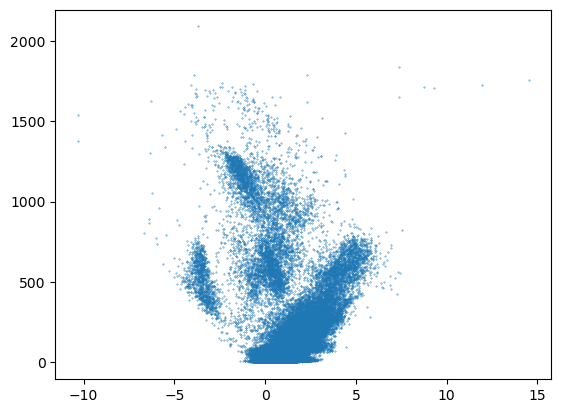

In [22]:
imported_data = np.load('/Users/benjaminhanf/Desktop/pomona_s25/thesis/pipeline/to_green_planet/25/savez_arrays_25.npz')

import_ids = imported_data['ids'][:]
jp = imported_data['jp'][:]
jr = imported_data['jr'][:]
jz = imported_data['jz'][:]

print(len(import_ids), len(jp), len(jr), len(jz))

plt.scatter(jp, jr, s=0.1)



<>:16: SyntaxWarning: invalid escape sequence '\p'
<>:16: SyntaxWarning: invalid escape sequence '\p'
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/1435422717.py:16: SyntaxWarning: invalid escape sequence '\p'
  plt.xlabel("$J_{\phi}$ [kpc km/s]")


95354
51428
10134
5119
7083


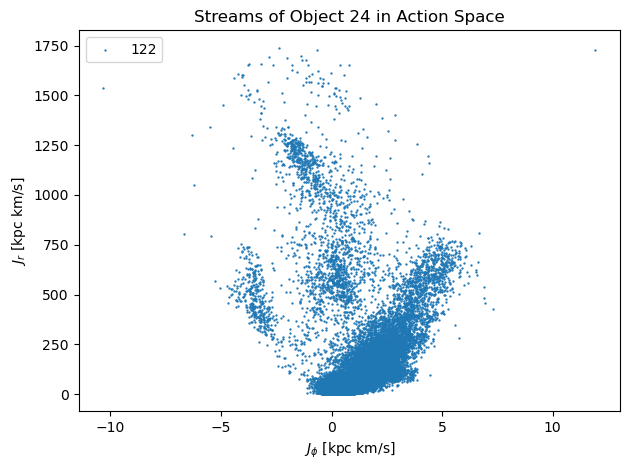

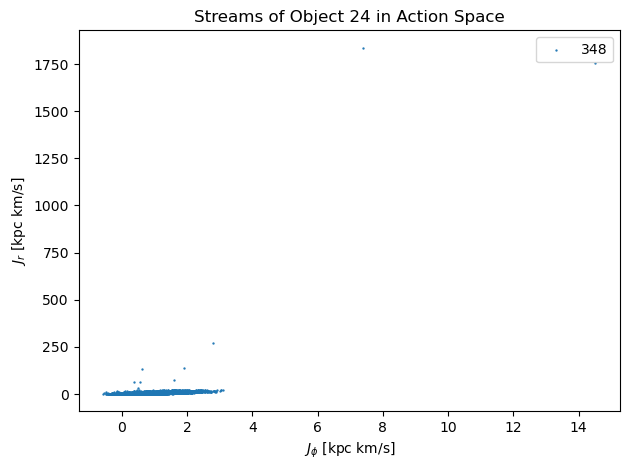

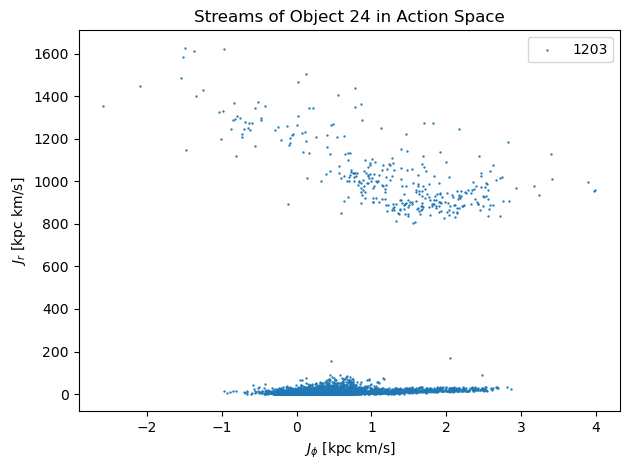

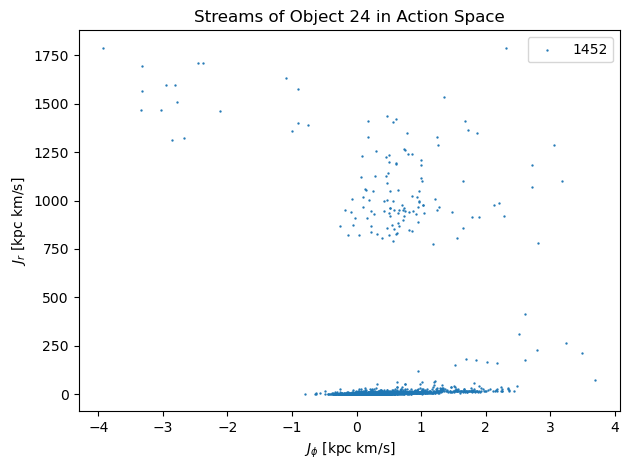

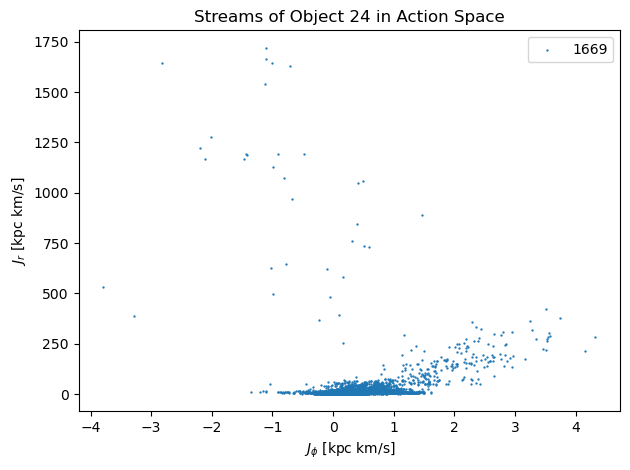

In [13]:
sats_ids_24 = sats_particles_ids[0]

isinlist = []
for sat_ids in sats_ids_24:
    isinlist.append(np.isin(import_ids, sat_ids))
    print(sum(isinlist[-1]))
    
for j,list in enumerate(isinlist):
    if sat_obj_ids[0][j] != 0:
        plt.scatter(jp[list], jr[list], s=0.45, label = str(sat_obj_ids[0][j]), alpha=1)
        # plt.hexbin(jp[list], jr[list])

    plt.title("Streams of Object 24 in Action Space")
    # plt.xlim(-0.5,2)
    # plt.ylim(0,50)
    plt.xlabel("$J_{\phi}$ [kpc km/s]")
    plt.ylabel("$J_{r}$ [kpc km/s]")
    plt.legend()
    plt.tight_layout()
    plt.show()

# plt.savefig('./obj_24_streams_jr_jp.jpg', dpi=300)
    

<>:19: SyntaxWarning: invalid escape sequence '\p'
<>:19: SyntaxWarning: invalid escape sequence '\p'
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_27865/2195954560.py:19: SyntaxWarning: invalid escape sequence '\p'
  plt.xlabel("$J_{\phi}$ [kpc km/s]")


95354
51428
10134
5119
7083


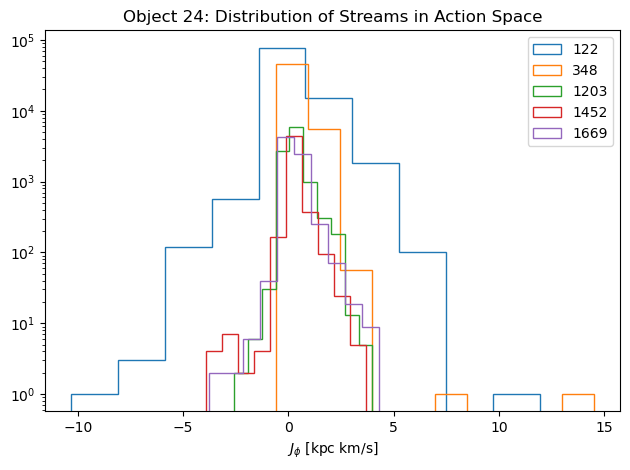

In [ ]:
sats_ids_24 = sats_particles_ids[0]

plt.style.use('default')

isinlist = []
for sat_ids in sats_ids_24:
    isinlist.append(np.isin(import_ids, sat_ids))
    print(sum(isinlist[-1]))
    
for j,list in enumerate(isinlist):
    if sat_obj_ids[0][j] != 0:
        plt.hist(jp[list], histtype='step', label = str(sat_obj_ids[0][j]), log=True)
        # plt.scatter(jp[list], jr[list], s=0.45, label = str(sat_obj_ids[0][j]), alpha=1)
        # plt.hexbin(jp[list], jr[list])

plt.title("Object 24: Distribution of Streams in Action Space")
# plt.xlim(-0.5,2)
# plt.ylim(0,50)
plt.xlabel("$J_{\phi}$ [kpc km/s]")
# plt.ylabel("$J_{r}$ [kpc km/s]")
plt.legend()
plt.tight_layout()
plt.show()

# plt.savefig('./obj_24_streams_jr_jp.jpg', dpi=300)
    

95354
51428
10134
5119
7083


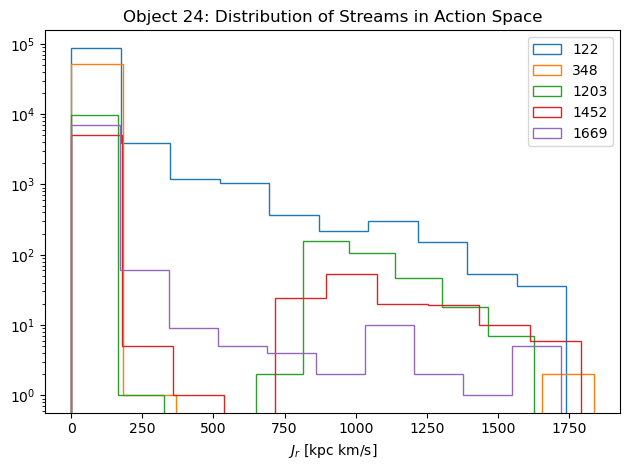

In [ ]:
sats_ids_24 = sats_particles_ids[0]

plt.style.use('default')

isinlist = []
for sat_ids in sats_ids_24:
    isinlist.append(np.isin(import_ids, sat_ids))
    print(sum(isinlist[-1]))
    
for j,list in enumerate(isinlist):
    if sat_obj_ids[0][j] != 0:
        plt.hist(jr[list], histtype='step', label = str(sat_obj_ids[0][j]), log=True)
        # plt.scatter(jp[list], jr[list], s=0.45, label = str(sat_obj_ids[0][j]), alpha=1)
        # plt.hexbin(jp[list], jr[list])

plt.title("Object 24: Distribution of Streams in Action Space")
# plt.xlim(-0.5,2)
# plt.ylim(0,50)
# plt.xlabel("$J_{\phi}$ [kpc km/s]")
plt.xlabel("$J_{r}$ [kpc km/s]")
plt.legend()
plt.tight_layout()
plt.show()

# plt.savefig('./obj_24_streams_jr_jp.jpg', dpi=300)

95354
51428
10134
5119
7083


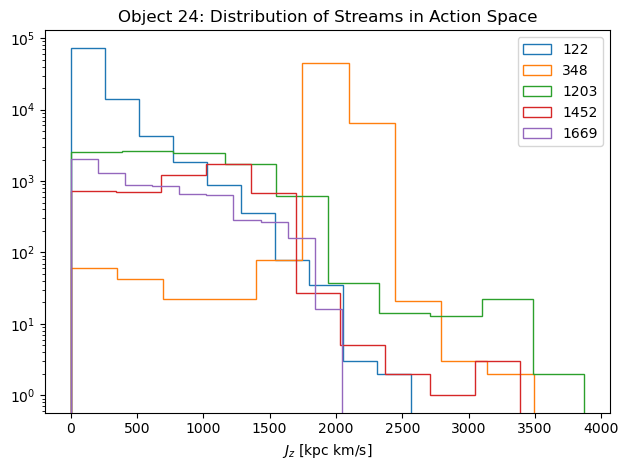

In [ ]:
sats_ids_24 = sats_particles_ids[0]

plt.style.use('default')

isinlist = []
for sat_ids in sats_ids_24:
    isinlist.append(np.isin(import_ids, sat_ids))
    print(sum(isinlist[-1]))
    
for j,list in enumerate(isinlist):
    if sat_obj_ids[0][j] != 0:
        plt.hist(jz[list], histtype='step', label = str(sat_obj_ids[0][j]), log=True)
        # plt.scatter(jp[list], jr[list], s=0.45, label = str(sat_obj_ids[0][j]), alpha=1)
        # plt.hexbin(jp[list], jr[list])

plt.title("Object 24: Distribution of Streams in Action Space")
# plt.xlim(-0.5,2)
# plt.ylim(0,50)
# plt.xlabel("$J_{\phi}$ [kpc km/s]")
plt.xlabel("$J_{z}$ [kpc km/s]")
plt.legend()
plt.tight_layout()
plt.show()

# plt.savefig('./obj_24_streams_jr_jp.jpg', dpi=300)
    
plt.style.use('default')

<>:11: SyntaxWarning: invalid escape sequence '\p'
<>:11: SyntaxWarning: invalid escape sequence '\p'
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/2670508044.py:11: SyntaxWarning: invalid escape sequence '\p'
  plt.xlabel("$J_{\phi}$ [kpc km/s]")


95354
51428
10134
5119
7083


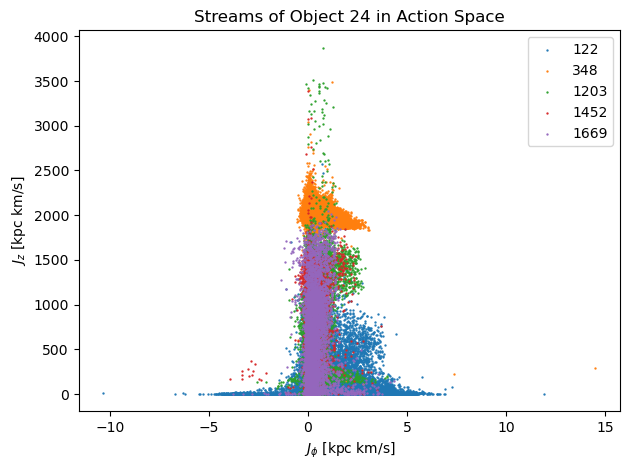

In [14]:
sats_ids_24 = sats_particles_ids[0]

isinlist = []
for sat_ids in sats_ids_24:
    isinlist.append(np.isin(import_ids, sat_ids))
    print(sum(isinlist[-1]))
    
for j,list in enumerate(isinlist):
    plt.scatter(jp[list], jz[list], s=0.45, label = str(sat_obj_ids[0][j]))
plt.title("Streams of Object 24 in Action Space")
plt.xlabel("$J_{\phi}$ [kpc km/s]")
plt.ylabel("$J_{z}$ [kpc km/s]")
plt.legend()
plt.tight_layout()

plt.savefig('./obj_24_streams_jz_jp.jpg', dpi=300)
    

95354
51428
10134
5119
7083


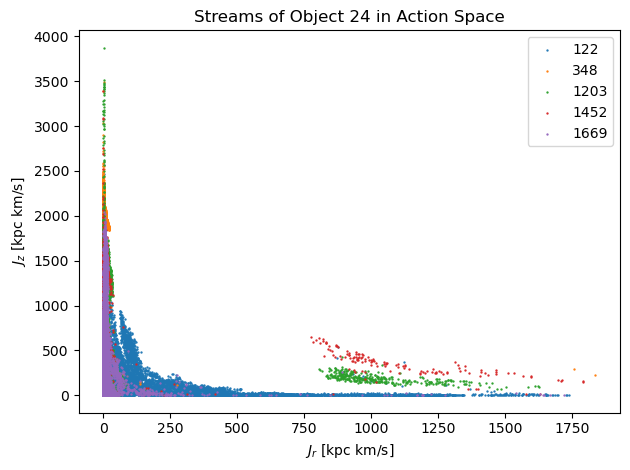

In [15]:
sats_ids_24 = sats_particles_ids[0]

isinlist = []
for sat_ids in sats_ids_24:
    isinlist.append(np.isin(import_ids, sat_ids))
    print(sum(isinlist[-1]))
    
for j,list in enumerate(isinlist):
    plt.scatter(jr[list], jz[list], s=0.45, label = str(sat_obj_ids[0][j]))
plt.title("Streams of Object 24 in Action Space")
plt.xlabel("$J_{r}$ [kpc km/s]")
plt.ylabel("$J_{z}$ [kpc km/s]")
plt.legend()
plt.tight_layout()

plt.savefig('./obj_24_streams_jz_jr.jpg', dpi=300)
    

<>:13: SyntaxWarning: invalid escape sequence '\p'
<>:17: SyntaxWarning: invalid escape sequence '\p'
<>:13: SyntaxWarning: invalid escape sequence '\p'
<>:17: SyntaxWarning: invalid escape sequence '\p'
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/62584377.py:13: SyntaxWarning: invalid escape sequence '\p'
  axs[0,0].set_xlabel('$J_{\phi} = L_z [kpc km/s]$', fontsize = font_size)
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/62584377.py:17: SyntaxWarning: invalid escape sequence '\p'
  axs[1,0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize = font_size)


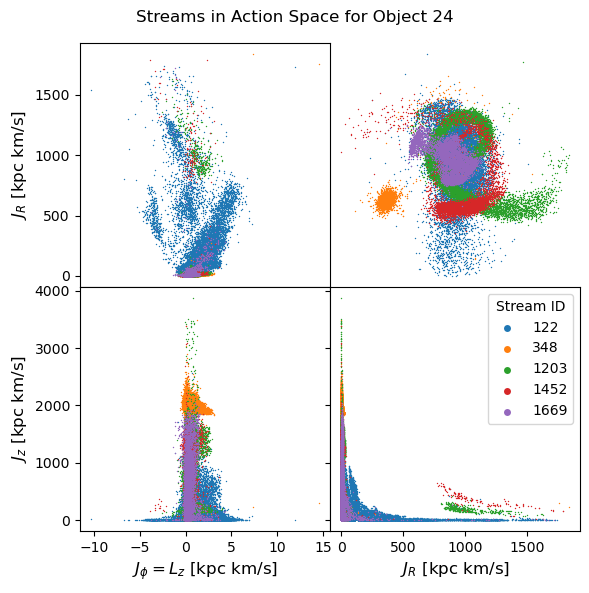

In [21]:
fig = plt.figure(figsize=(6,6))
gs = fig.add_gridspec(2, 2, hspace=0, wspace=0)
# (ax1, ax2), (ax3, ax4) = gs.subplots(sharex='col', sharey='row')
axs = gs.subplots(sharex=False, sharey=False)
n=1
font_size = 12

for i,list in enumerate(isinlist):
    size = 1
    alph= 1

    axs[0,0].scatter(jp[list], jr[list], s=size, label = str(sat_obj_ids[0][i]), linewidths=0)
    axs[0,0].set_xlabel('$J_{\phi} = L_z [kpc km/s]$', fontsize = font_size)
    axs[0,0].set_ylabel('$J_R$ [kpc km/s]', fontsize = font_size)

    axs[1,0].scatter(jp[list], jz[list], s=size, label = str(sat_obj_ids[0][i]), linewidths=0)
    axs[1,0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize = font_size)
    axs[1,0].set_ylabel('$J_z$ [kpc km/s]', fontsize = font_size)

    axs[1,1].scatter(jr[list], jz[list], s=size, label = str(sat_obj_ids[0][i]), linewidths=0)
    axs[1,1].set_xlabel('$J_R$ [kpc km/s]', fontsize = font_size)
    axs[1,1].set_ylabel('$J_z$ [kpc km/s]', fontsize = font_size)
    # axs[1,1].set_ylim(-40, 1200)
    
    alph=1
    size=1
    
    j=0
    x = hosts[j]['stellar_x'][:][indices[j][i]]
    y = hosts[j]['stellar_y'][:][indices[j][i]]
    axs[0,1].scatter(x, y, s=size, linewidths=0, alpha = alph)


fig.suptitle('Streams in Action Space for Object 24')

axs[0,1].axis('off')

for ax in fig.get_axes():
    ax.label_outer()

lgnd = plt.legend(title="Stream ID", markerscale=5)

plt.tight_layout()

# plt.savefig('./obj_24_action_space_streams_jrjpjzxy.jpg', dpi= 300)

plt.show()

<>:18: SyntaxWarning: invalid escape sequence '\p'
<>:23: SyntaxWarning: invalid escape sequence '\p'
<>:18: SyntaxWarning: invalid escape sequence '\p'
<>:23: SyntaxWarning: invalid escape sequence '\p'
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/3032235444.py:18: SyntaxWarning: invalid escape sequence '\p'
  axs[0,0].set_xlabel('$J_{\phi} = L_z [kpc km/s]$', fontsize = font_size)
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/3032235444.py:23: SyntaxWarning: invalid escape sequence '\p'
  axs[1,0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize = font_size)


0


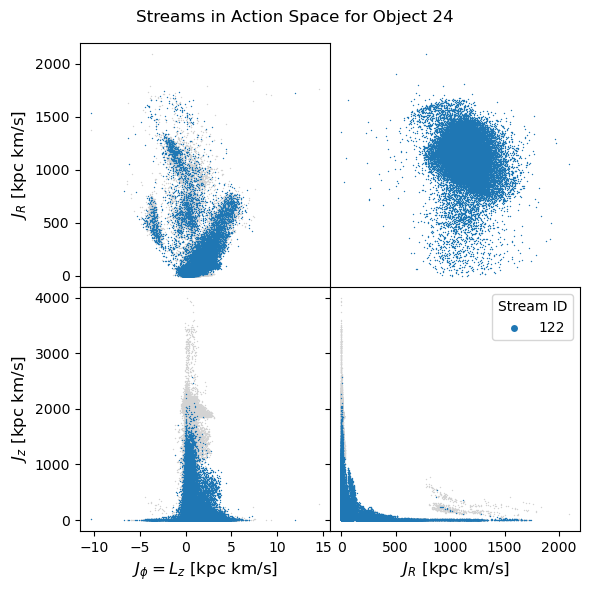

1


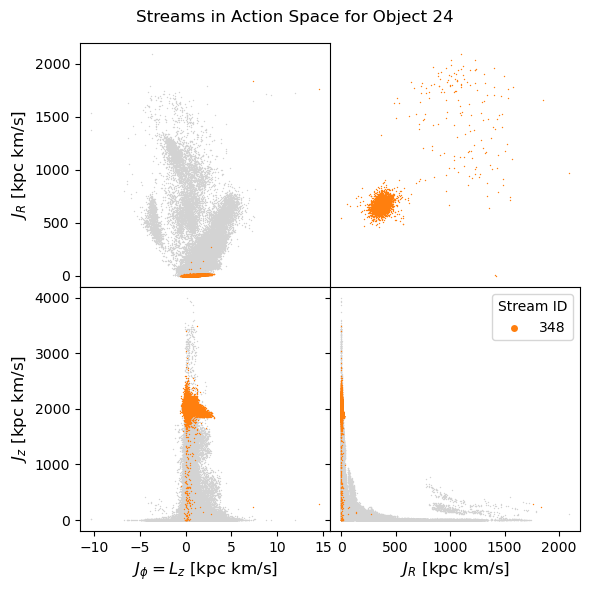

2


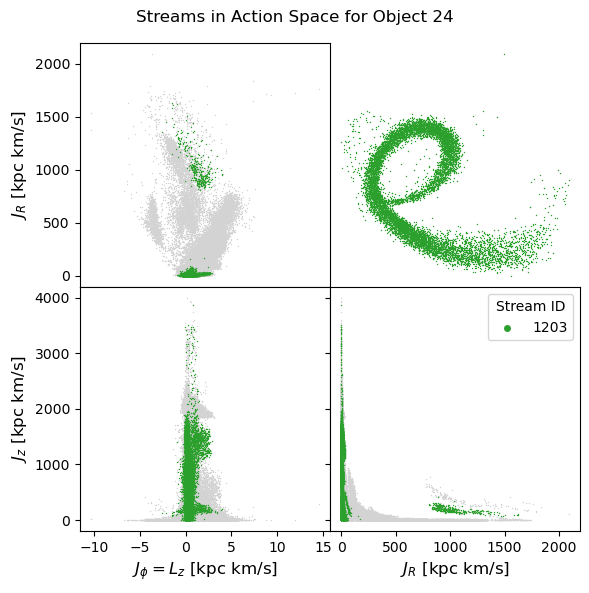

3


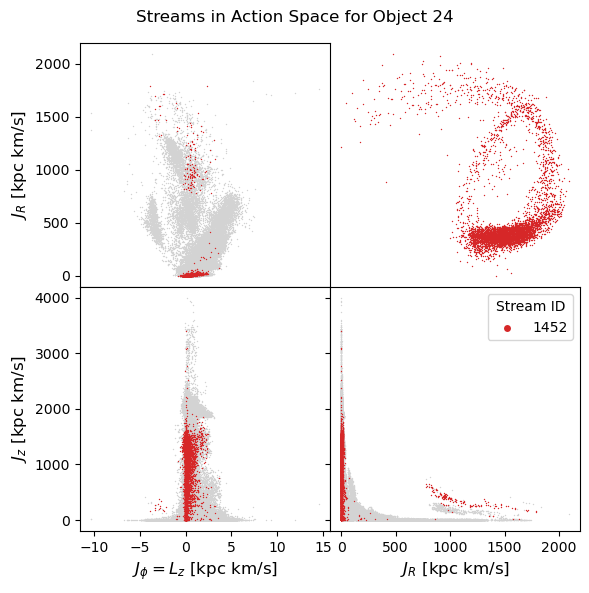

4


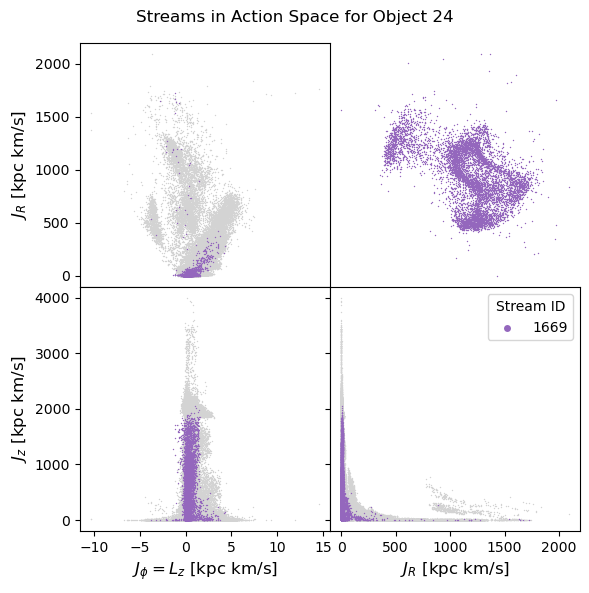

In [23]:
for i,list in enumerate(isinlist):
    
    fig = plt.figure(figsize=(6,6))
    gs = fig.add_gridspec(2, 2, hspace=0, wspace=0)
    # (ax1, ax2), (ax3, ax4) = gs.subplots(sharex='col', sharey='row')
    axs = gs.subplots(sharex=False, sharey=False)
    n=1
    font_size = 12
    
    print(i)
    size = 1
    alph= 1
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
    galph = 1

    axs[0,0].scatter(jp[list], jr[list], s=size, label = str(sat_obj_ids[0][i]), linewidths=0, c=colors[i])
    axs[0,0].scatter(jp[~list], jr[~list], s=size, linewidths=0, c='lightgrey', zorder = -2, alpha=galph)
    axs[0,0].set_xlabel('$J_{\phi} = L_z [kpc km/s]$', fontsize = font_size)
    axs[0,0].set_ylabel('$J_R$ [kpc km/s]', fontsize = font_size)

    axs[1,0].scatter(jp[list], jz[list], s=size, label = str(sat_obj_ids[0][i]), linewidths=0, c=colors[i])
    axs[1,0].scatter(jp[~list], jz[~list], s=size, linewidths=0, c='lightgrey', zorder = -2, alpha=galph)
    axs[1,0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize = font_size)
    axs[1,0].set_ylabel('$J_z$ [kpc km/s]', fontsize = font_size)

    axs[1,1].scatter(jr[list], jz[list], s=size, label = str(sat_obj_ids[0][i]), linewidths=0,c=colors[i])
    axs[1,1].scatter(jr[~list], jz[~list], s=size, linewidths=0, c='lightgrey', zorder = -2, alpha=galph)
    axs[1,1].set_xlabel('$J_R$ [kpc km/s]', fontsize = font_size)
    axs[1,1].set_ylabel('$J_z$ [kpc km/s]', fontsize = font_size)
    # axs[1,1].set_ylim(-40, 1200)
    
    alph=1
    size=1
    
    j=0
    # notmask = ~indices[j][i]
    x = hosts[j]['stellar_x'][:][indices[j][i]]
    y = hosts[j]['stellar_y'][:][indices[j][i]]
    # notx = hosts[j]['stellar_x'][:][notmask]
    # noty = hosts[j]['stellar_y'][:][notmask]
    # axs[0,1].scatter(notx, noty, s=size, linewidths=0, alpha = alph, c="lightgrey")
    axs[0,1].scatter(x, y, s=size, linewidths=0, alpha = alph, c=colors[i])

    fig.suptitle('Streams in Action Space for Object 24')

    axs[0,1].axis('off')

    for ax in fig.get_axes():
        ax.label_outer()

    lgnd = plt.legend(title="Stream ID", markerscale=5)

    plt.tight_layout()

    plt.savefig('./obj_24_action_space_streams_jrjpjzxy_stream ' + str(sat_obj_ids[0][i]) + '.jpg', dpi= 300)

    plt.show()

In [24]:
imported_data = []
for j,host in enumerate(host_ids):
    for filepath in glob.iglob(f'/Users/benjaminhanf/Desktop/pomona_s25/thesis/gp_download_action_finding/{host}/savez_arrays_{host}.*'):
        imported_data.append(np.load(filepath))
        print(f'{filepath} -> keys: {imported_data[j].keys()}')
        print(f'rotation matrix: \n {imported_data[j]['facemat']}')

/Users/benjaminhanf/Desktop/pomona_s25/thesis/gp_download_action_finding/25/savez_arrays_25.npz -> keys: KeysView(NpzFile '/Users/benjaminhanf/Desktop/pomona_s25/thesis/gp_download_action_finding/25/savez_arrays_25.npz' with keys: ids, x, y, z, jr...)
rotation matrix: 
 [[-0.59201896  0.          0.80592403]
 [-0.11317372  0.99009099 -0.08313562]
 [-0.79793813 -0.14042729 -0.58615264]]
/Users/benjaminhanf/Desktop/pomona_s25/thesis/gp_download_action_finding/28/savez_arrays_28.npz -> keys: KeysView(NpzFile '/Users/benjaminhanf/Desktop/pomona_s25/thesis/gp_download_action_finding/28/savez_arrays_28.npz' with keys: ids, x, y, z, jr...)
rotation matrix: 
 [[ 0.95211526 -0.          0.30573933]
 [ 0.02481322  0.99670124 -0.07727187]
 [-0.30473077  0.0811581   0.94897446]]
/Users/benjaminhanf/Desktop/pomona_s25/thesis/gp_download_action_finding/24/savez_arrays_24.npz -> keys: KeysView(NpzFile '/Users/benjaminhanf/Desktop/pomona_s25/thesis/gp_download_action_finding/24/savez_arrays_24.npz' wi

301886 301886 301886 301886


<>:34: SyntaxWarning: invalid escape sequence '\p'
<>:39: SyntaxWarning: invalid escape sequence '\p'
<>:34: SyntaxWarning: invalid escape sequence '\p'
<>:39: SyntaxWarning: invalid escape sequence '\p'
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_27865/2785373138.py:34: SyntaxWarning: invalid escape sequence '\p'
  axs[0,0].set_xlabel('$J_{\phi} = L_z [kpc km/s]$', fontsize = font_size)
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_27865/2785373138.py:39: SyntaxWarning: invalid escape sequence '\p'
  axs[1,0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize = font_size)


95371
51428
10134
5119
7083


/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_27865/2785373138.py:75: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_27865/2785373138.py:77: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig(f'./obj_{host_ids[l]}_action_space_streams_jrjpjzxy.jpg', dpi= 300)
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_27865/2785373138.py:77: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.savefig(f'./obj_{host_ids[l]}_action_space_streams_jrjpjzxy.jpg', dpi= 300)
/Users/benjaminhanf/opt/anaconda3/envs/pomthesis2/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


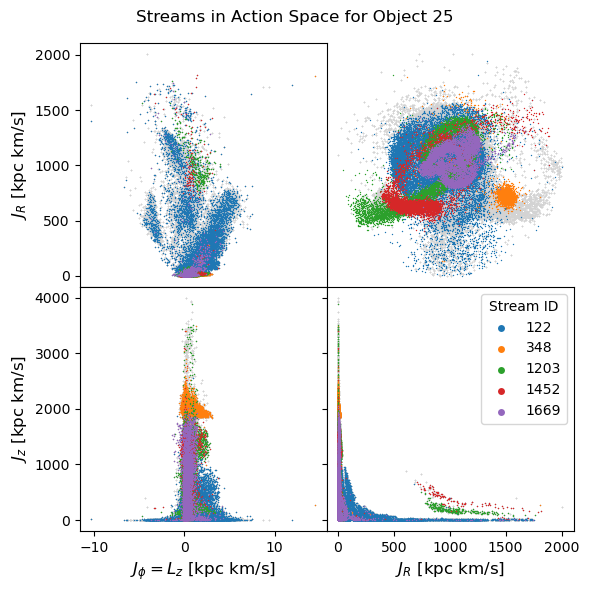

138894 138894 138894 138894
220
365
132


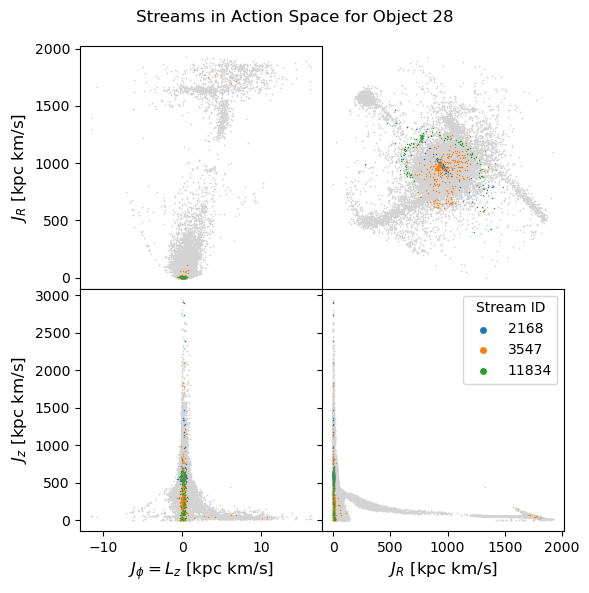

467451 467451 467451 467451
4075
131


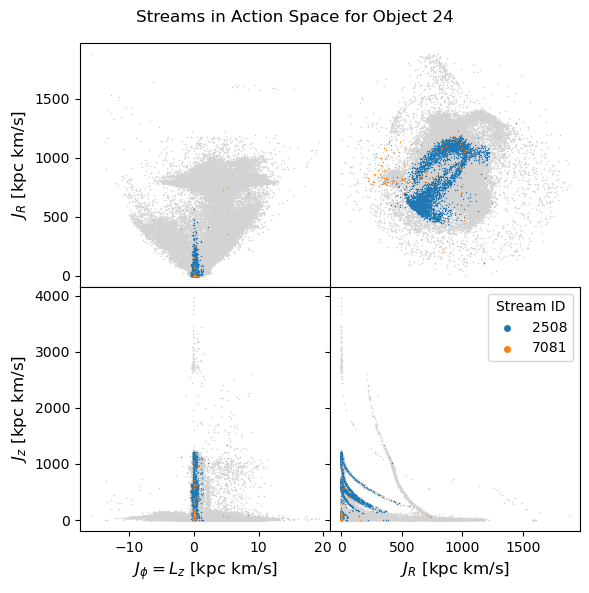

In [ ]:


#need imported_data, sats_particles_ids, indices, 

for l, host in enumerate(imported_data):
    
    import_ids = imported_data[l]['ids'][:]
    jp = imported_data[l]['jp'][:]
    jr = imported_data[l]['jr'][:]
    jz = imported_data[l]['jz'][:]
    
    #logarithmic
    # jr = np.log(jr)
    # jz = np.log(jz)
    
    print(len(import_ids), len(jp), len(jr), len(jz))
    
    isinlist = []
    for sat_ids in sats_particles_ids[l]:
        isinlist.append(np.isin(import_ids, sat_ids))
        print(sum(isinlist[-1]))
    
    fig = plt.figure(figsize=(6,6))
    gs = fig.add_gridspec(2, 2, hspace=0, wspace=0)
    # (ax1, ax2), (ax3, ax4) = gs.subplots(sharex='col', sharey='row')
    axs = gs.subplots(sharex=False, sharey=False)
    n=1
    font_size = 12

    for i,satlist in enumerate(isinlist):
        size = 1
        alph= 1

        axs[0,0].scatter(jp[satlist], jr[satlist], s=size, label = str(sat_obj_ids[l][i]), linewidths=0)
        axs[0,0].scatter(jp[~satlist], jr[~satlist], s=size, linewidths=0, c='lightgrey', zorder = -2, alpha=galph)
        axs[0,0].set_xlabel('$J_{\phi} = L_z [kpc km/s]$', fontsize = font_size)
        axs[0,0].set_ylabel('$J_R$ [kpc km/s]', fontsize = font_size)

        axs[1,0].scatter(jp[satlist], jz[satlist], s=size, label = str(sat_obj_ids[l][i]), linewidths=0)
        axs[1,0].scatter(jp[~satlist], jz[~satlist], s=size, linewidths=0, c='lightgrey', zorder = -2, alpha=galph)
        axs[1,0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize = font_size)
        axs[1,0].set_ylabel('$J_z$ [kpc km/s]', fontsize = font_size)

        axs[1,1].scatter(jr[satlist], jz[satlist], s=size, label = str(sat_obj_ids[l][i]), linewidths=0)
        axs[1,1].scatter(jr[~satlist], jz[~satlist], s=size, linewidths=0, c='lightgrey', zorder = -2, alpha=galph)
        axs[1,1].set_xlabel('$J_R$ [kpc km/s]', fontsize = font_size)
        axs[1,1].set_ylabel('$J_z$ [kpc km/s]', fontsize = font_size)
        # axs[1,1].set_ylim(-40, 1200)
        
        alph=1
        size=1
        
        mask = indices[l][i]
        
        pos = np.matmul(imported_data[l]['facemat'], np.vstack([hosts[l]['stellar_x'][:], hosts[l]['stellar_y'][:], hosts[l]['stellar_z'][:]]))
        x=pos[0][mask]
        y=pos[1][mask]
        
        # j=0
        # x = hosts[l]['stellar_x'][:][mask]
        # # notx = hosts[l]['stellar_x'][:][~mask]
        # y = hosts[l]['stellar_y'][:][mask]
        # # noty = hosts[l]['stellar_y'][:][~mask]
        axs[0,1].scatter(x, y, s=size, linewidths=0, alpha = alph)
        axs[0,1].scatter(hosts[l]['stellar_x'][:], hosts[l]['stellar_y'][:], s=size, color = "lightgrey", linewidths=0, alpha = alph, zorder = -2)


    fig.suptitle(f'Streams in Action Space for Object {host_ids[l]}')

    axs[0,1].axis('off')

    for ax in fig.get_axes():
        ax.label_outer()

    lgnd = plt.legend(title="Stream ID", markerscale=5)

    plt.tight_layout()

    fig.savefig(f'./obj_{host_ids[l]}_action_space_streams_jrjpjzxy.jpg', dpi= 300)

    plt.show()

<>:34: SyntaxWarning: invalid escape sequence '\p'
<>:39: SyntaxWarning: invalid escape sequence '\p'
<>:34: SyntaxWarning: invalid escape sequence '\p'
<>:39: SyntaxWarning: invalid escape sequence '\p'
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/2718415878.py:34: SyntaxWarning: invalid escape sequence '\p'
  axs[0,0].set_xlabel('$J_{\phi} = L_z [kpc km/s]$', fontsize = font_size)
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/2718415878.py:39: SyntaxWarning: invalid escape sequence '\p'
  axs[1,0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize = font_size)


301886 301886 301886 301886
95371
51428
10134
5119
7083


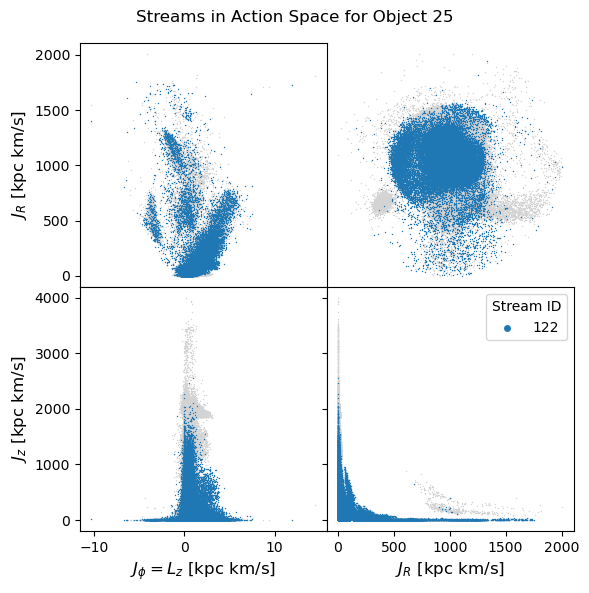

/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/2718415878.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lgnd = plt.legend(title="Stream ID", markerscale=5)


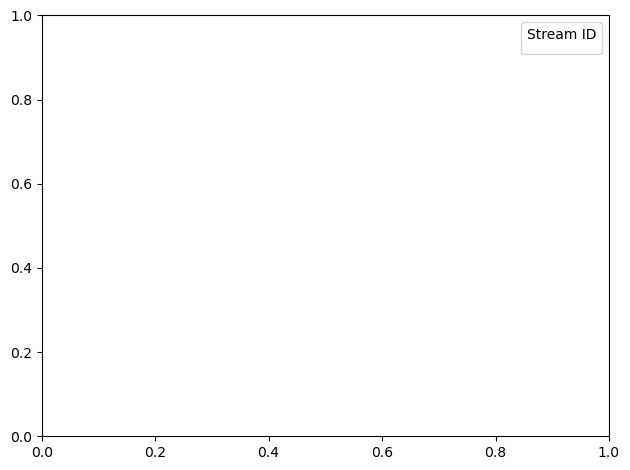

/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/2718415878.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lgnd = plt.legend(title="Stream ID", markerscale=5)


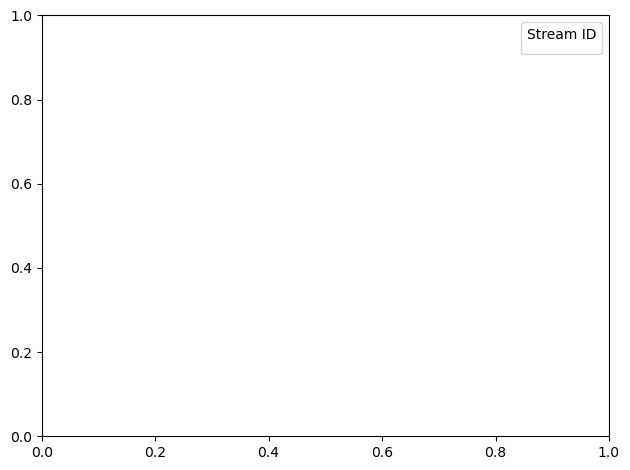

/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/2718415878.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lgnd = plt.legend(title="Stream ID", markerscale=5)


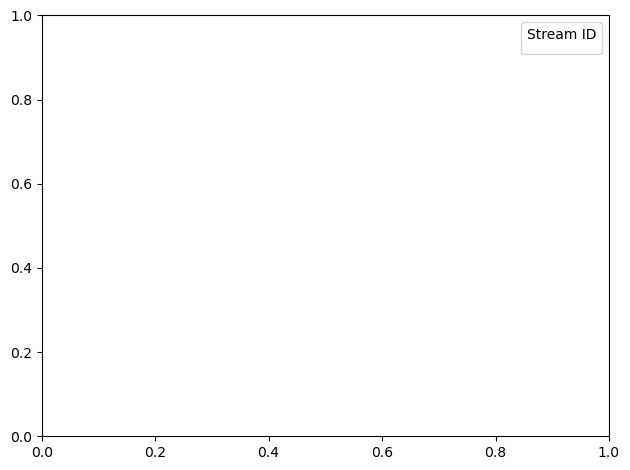

/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/2718415878.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lgnd = plt.legend(title="Stream ID", markerscale=5)


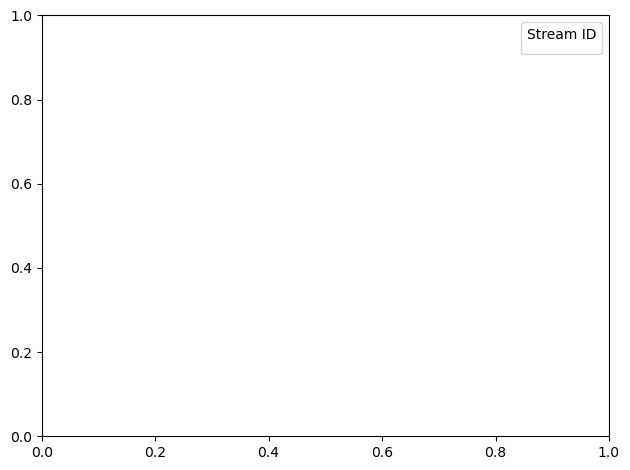

138894 138894 138894 138894
220
365
132


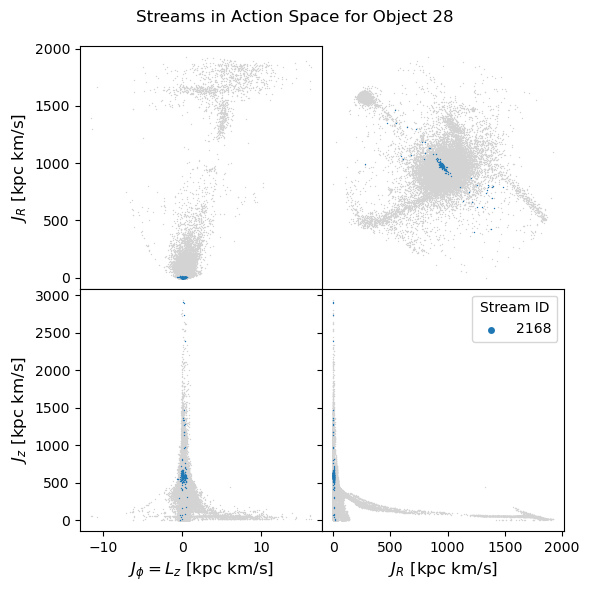

/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/2718415878.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lgnd = plt.legend(title="Stream ID", markerscale=5)


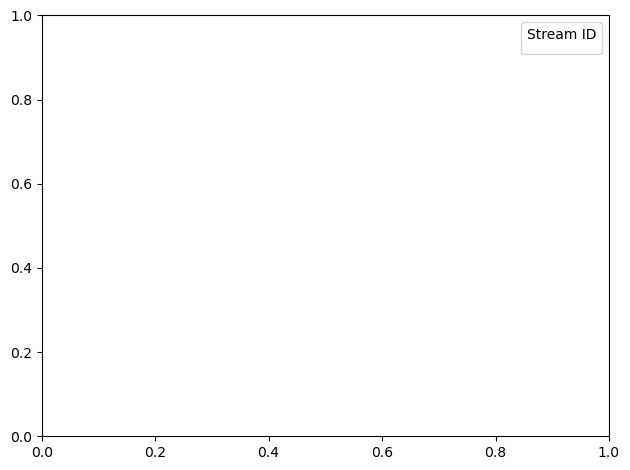

/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/2718415878.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lgnd = plt.legend(title="Stream ID", markerscale=5)


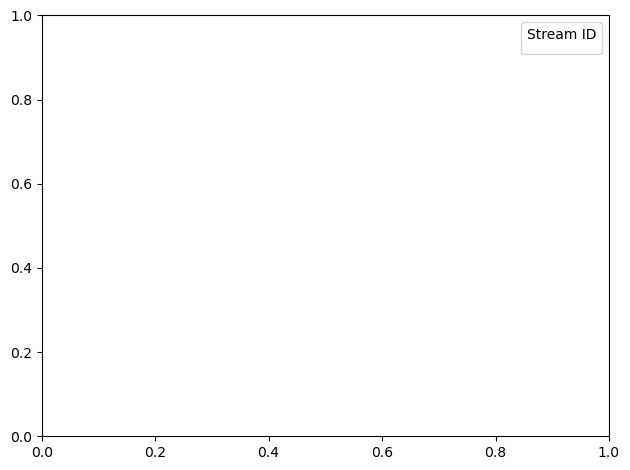

467451 467451 467451 467451
4075
131


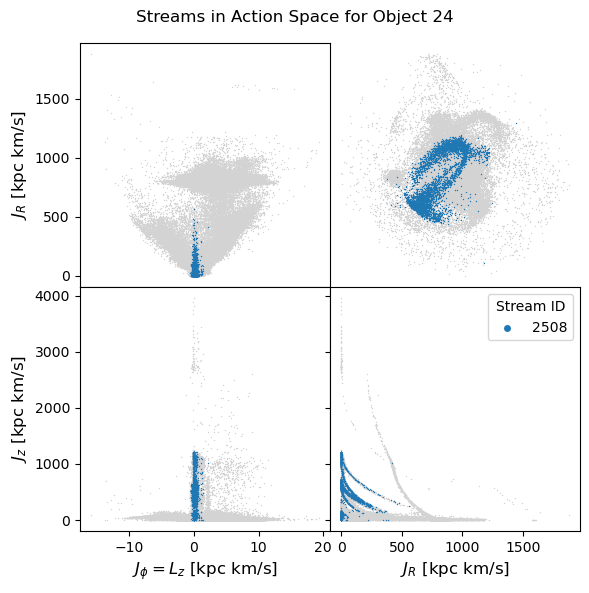

/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/2718415878.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  lgnd = plt.legend(title="Stream ID", markerscale=5)


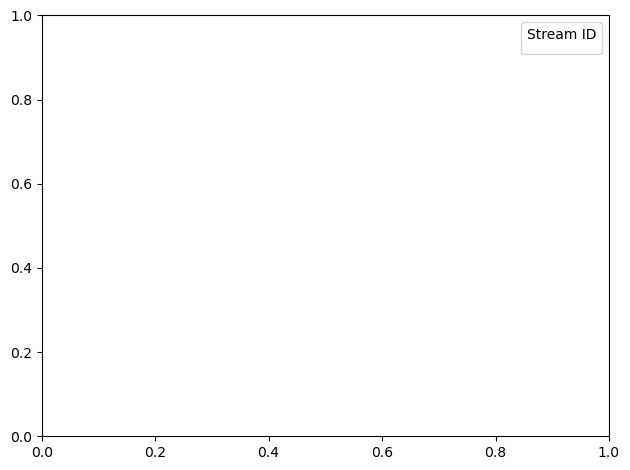

In [25]:


#matallicity

for l, host in enumerate(imported_data):
    
    import_ids = imported_data[l]['ids'][:]
    jp = imported_data[l]['jp'][:]
    jr = imported_data[l]['jr'][:]
    jz = imported_data[l]['jz'][:]
    
    #logarithmic
    # jr = np.log(jr)
    # jz = np.log(jz)
    
    print(len(import_ids), len(jp), len(jr), len(jz))
    
    isinlist = []
    for sat_ids in sats_particles_ids[l]:
        isinlist.append(np.isin(import_ids, sat_ids))
        print(sum(isinlist[-1]))
    
    fig = plt.figure(figsize=(6,6))
    gs = fig.add_gridspec(2, 2, hspace=0, wspace=0)
    # (ax1, ax2), (ax3, ax4) = gs.subplots(sharex='col', sharey='row')
    axs = gs.subplots(sharex=False, sharey=False)
    n=1
    font_size = 12

    for i,satlist in enumerate(isinlist):
        size = 1
        alph= 1

        axs[0,0].scatter(jp[satlist], jr[satlist], s=size, label = str(sat_obj_ids[l][i]), linewidths=0)
        axs[0,0].scatter(jp[~satlist], jr[~satlist], s=size, linewidths=0, c='lightgrey', zorder = -2, alpha=galph)
        axs[0,0].set_xlabel('$J_{\phi} = L_z [kpc km/s]$', fontsize = font_size)
        axs[0,0].set_ylabel('$J_R$ [kpc km/s]', fontsize = font_size)

        axs[1,0].scatter(jp[satlist], jz[satlist], s=size, label = str(sat_obj_ids[l][i]), linewidths=0)
        axs[1,0].scatter(jp[~satlist], jz[~satlist], s=size, linewidths=0, c='lightgrey', zorder = -2, alpha=galph)
        axs[1,0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize = font_size)
        axs[1,0].set_ylabel('$J_z$ [kpc km/s]', fontsize = font_size)

        axs[1,1].scatter(jr[satlist], jz[satlist], s=size, label = str(sat_obj_ids[l][i]), linewidths=0)
        axs[1,1].scatter(jr[~satlist], jz[~satlist], s=size, linewidths=0, c='lightgrey', zorder = -2, alpha=galph)
        axs[1,1].set_xlabel('$J_R$ [kpc km/s]', fontsize = font_size)
        axs[1,1].set_ylabel('$J_z$ [kpc km/s]', fontsize = font_size)
        # axs[1,1].set_ylim(-40, 1200)
        
        alph=1
        size=1
        
        mask = indices[l][i]
        
        pos = np.matmul(imported_data[l]['facemat'], np.vstack([hosts[l]['stellar_x'][:], hosts[l]['stellar_y'][:], hosts[l]['stellar_z'][:]]))
        x=pos[0][mask]
        y=pos[1][mask]
        
        # j=0
        # x = hosts[l]['stellar_x'][:][mask]
        # # notx = hosts[l]['stellar_x'][:][~mask]
        # y = hosts[l]['stellar_y'][:][mask]
        # # noty = hosts[l]['stellar_y'][:][~mask]
        axs[0,1].scatter(x, y, s=size, linewidths=0, alpha = alph)
        axs[0,1].scatter(hosts[l]['stellar_x'][:], hosts[l]['stellar_y'][:], s=size, color = "lightgrey", linewidths=0, alpha = alph, zorder = -2)


        fig.suptitle(f'Streams in Action Space for Object {host_ids[l]}')

        axs[0,1].axis('off')

        for ax in fig.get_axes():
            ax.label_outer()

        lgnd = plt.legend(title="Stream ID", markerscale=5)

        plt.tight_layout()

        plt.savefig(f'./obj_{host_ids[l]}_action_space_streams_jrjpjzxy_bigtest.jpg', dpi= 300)
        plt.show()

<>:26: SyntaxWarning: invalid escape sequence '\p'
<>:31: SyntaxWarning: invalid escape sequence '\p'
<>:26: SyntaxWarning: invalid escape sequence '\p'
<>:31: SyntaxWarning: invalid escape sequence '\p'
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/3059426748.py:26: SyntaxWarning: invalid escape sequence '\p'
  axs[0, 0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize=font_size)
/var/folders/cs/cpwlb8215w7_8nfgdjnp7y400000gn/T/ipykernel_30512/3059426748.py:31: SyntaxWarning: invalid escape sequence '\p'
  axs[1, 0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize=font_size)


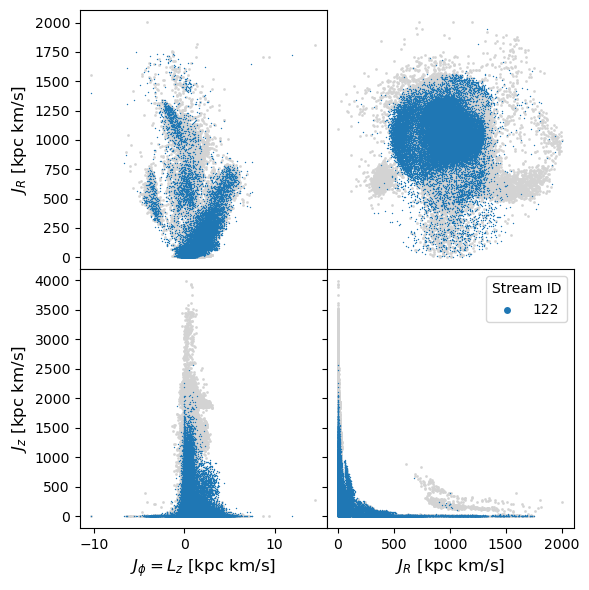

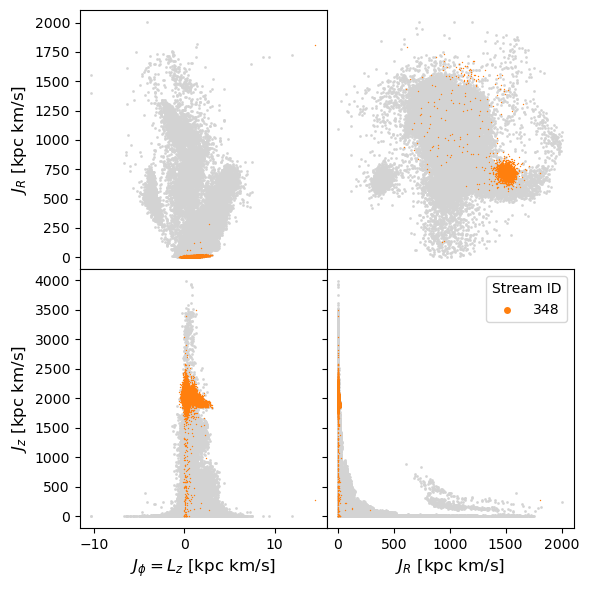

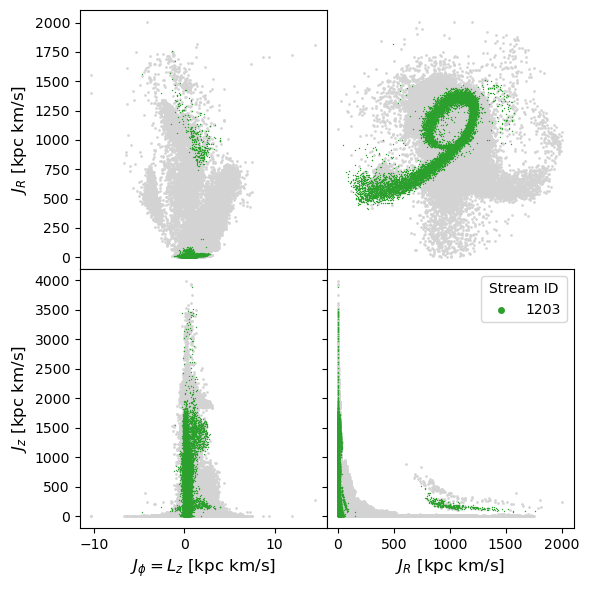

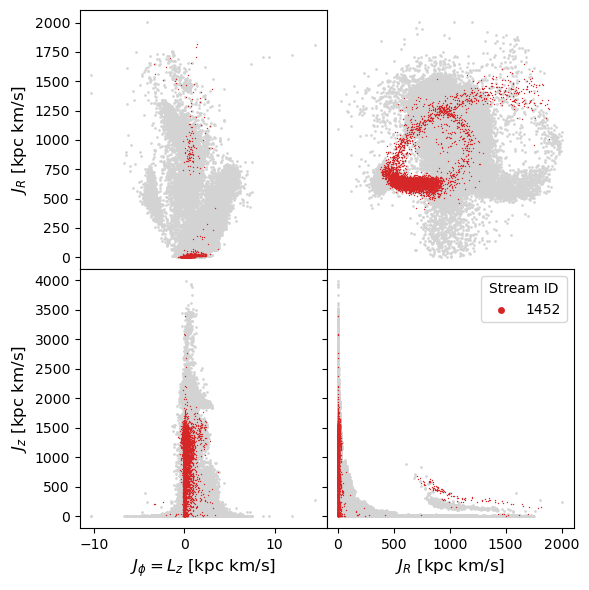

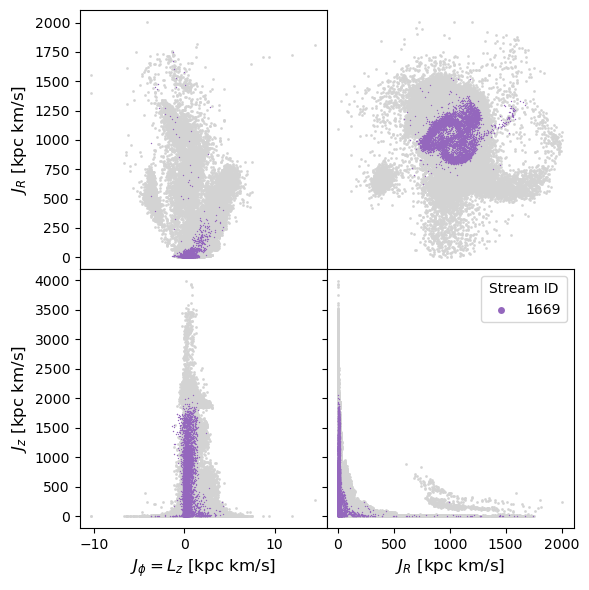

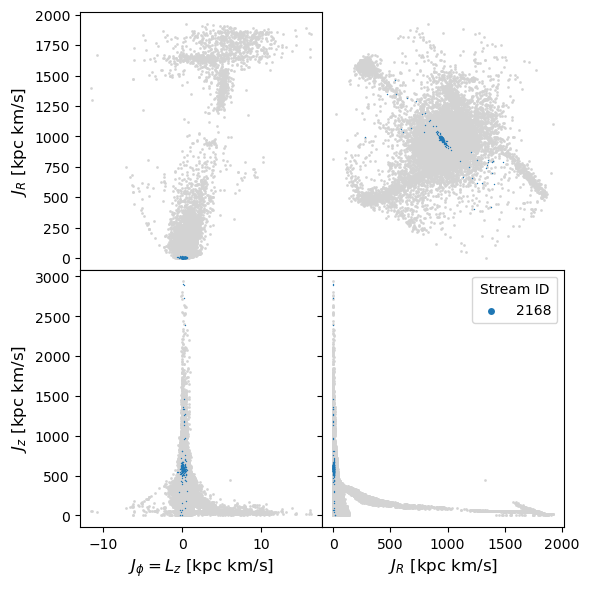

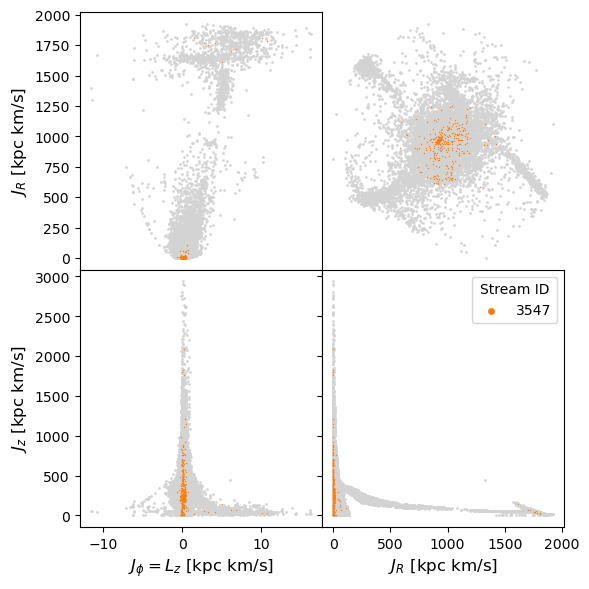

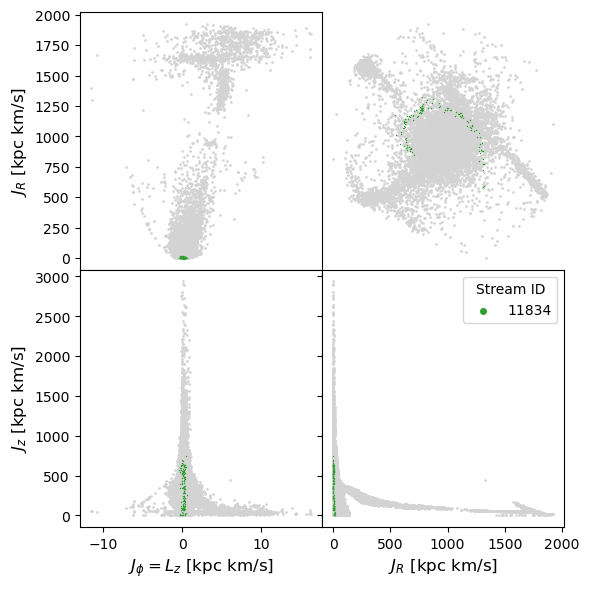

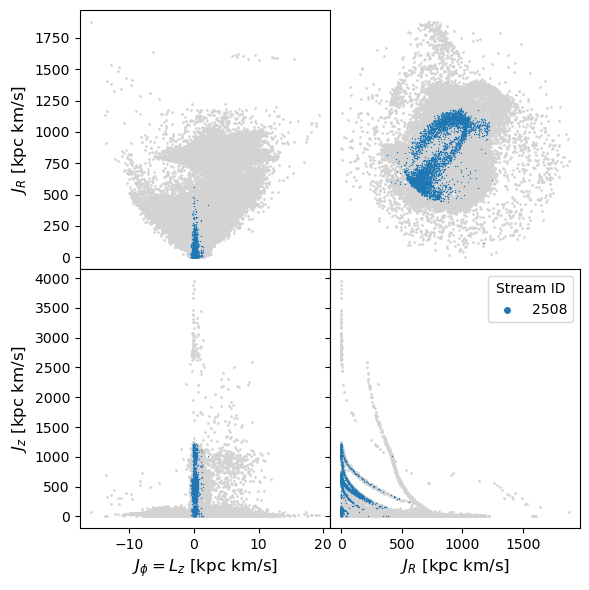

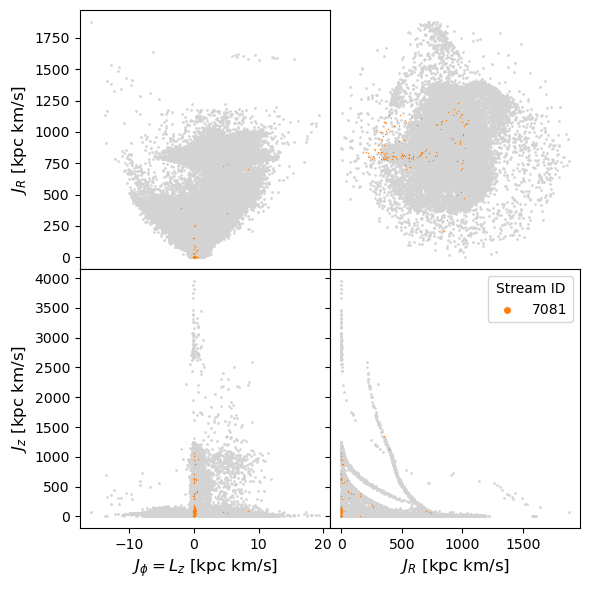

In [29]:
for l, host in enumerate(imported_data):
    import_ids = host['ids'][:]
    jp = host['jp'][:]
    jr = host['jr'][:]
    jz = host['jz'][:]
    pos = np.matmul(host['facemat'], np.vstack([
        hosts[l]['stellar_x'][:], hosts[l]['stellar_y'][:], hosts[l]['stellar_z'][:]
    ]))

    for i, sat_ids in enumerate(sats_particles_ids[l]):
        sat_mask = np.isin(import_ids, sat_ids)
        stream_id = sat_obj_ids[l][i]
        color = colors[i % len(colors)]
        mask = indices[l][i]

        fig = plt.figure(figsize=(6, 6))
        gs = fig.add_gridspec(2, 2, hspace=0, wspace=0)
        axs = gs.subplots(sharex=False, sharey=False)

        font_size = 12
        size = 1
        galph = .9

        axs[0, 0].scatter(jp[~sat_mask], jr[~sat_mask], s=size, color='lightgrey', zorder=-2, alpha=galph)
        axs[0, 0].scatter(jp[sat_mask], jr[sat_mask], s=size, color=color, linewidths=0)
        axs[0, 0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize=font_size)
        axs[0, 0].set_ylabel('$J_R$ [kpc km/s]', fontsize=font_size)

        axs[1, 0].scatter(jp[~sat_mask], jz[~sat_mask], s=size, color='lightgrey', zorder=-2, alpha=galph)
        axs[1, 0].scatter(jp[sat_mask], jz[sat_mask], s=size, color=color, linewidths=0)
        axs[1, 0].set_xlabel('$J_{\phi} = L_z$ [kpc km/s]', fontsize=font_size)
        axs[1, 0].set_ylabel('$J_z$ [kpc km/s]', fontsize=font_size)

        axs[1, 1].scatter(jr[~sat_mask], jz[~sat_mask], s=size, color='lightgrey', zorder=-2, alpha=galph)
        axs[1, 1].scatter(jr[sat_mask], jz[sat_mask], s=size, color=color, linewidths=0, label = str(sat_obj_ids[l][i]))
        axs[1, 1].set_xlabel('$J_R$ [kpc km/s]', fontsize=font_size)
        axs[1, 1].set_ylabel('$J_z$ [kpc km/s]', fontsize=font_size)

        axs[0, 1].scatter(hosts[l]['stellar_x'], hosts[l]['stellar_y'], s=size, color='lightgrey', zorder=-2, alpha=galph)
        axs[0, 1].scatter(pos[0][mask], pos[1][mask], s=size, color=color, linewidths=0)
        axs[0, 1].axis('off')

        # fig.suptitle(f'Stream {stream_id} in Host {host_ids[l]}', fontsize=14)

        for ax in fig.get_axes():
            ax.label_outer()


        lgnd = plt.legend(title="Stream ID", markerscale=5)

        plt.tight_layout()
        
        plt.savefig(f'./host_{host_ids[l]}_stream_{stream_id}_action_space.jpg', dpi=300)
        plt.show()


In [60]:
imported_data[0]['ids']

array([1.33911452e+08, 1.62271084e+08, 1.40212135e+08, ...,
       1.12942925e+08, 9.61442380e+07, 1.12965459e+08])

In [64]:
for l, host in enumerate([imported_data[0]]):
    import_ids = host['ids'][:]
    jp = host['jp'][:]
    jr = host['jr'][:]
    jz = host['jz'][:]
    pos = np.matmul(host['facemat'], np.vstack([
        hosts[l]['stellar_x'][:], hosts[l]['stellar_y'][:], hosts[l]['stellar_z'][:]
    ]))

    for i, sat_ids in enumerate(sats_particles_ids[l]):
        sat_mask = np.isin(import_ids, sat_ids)
        stream_id = sat_obj_ids[l][i]
        color = colors[i % len(colors)]
        mask = indices[l][i]
        labels = np.full_like(import_ids, -999, dtype=int)  # initialize with some placeholder

        for i, sat_ids in enumerate(sats_particles_ids[l]):
            sat_mask = np.isin(import_ids, sat_ids)
            stream_id = sat_obj_ids[l][i]  # e.g. -1, 0, 1, ...
            
            labels[sat_mask] = stream_id  # assign stream ID to matching particles

In [ ]:
set(labels)


{-999, 122, 348, 1203, 1452, 1669}

In [66]:
# Save
with open('./extracted_labels_25.pkl', 'wb') as f:
    pickle.dump(labels, f)

# Load
with open('./extracted_labels_25.pkl', 'rb') as f:
    labels25 = pickle.load(f)

In [67]:
labels25

array([ 122, -999,  122, ..., -999, -999, -999])

In [ ]:
# print('bh')

# masks = 

# masks = np.array(masks)

# # Shift group numbers: [-1, 0, 1, ..., m-2]
# group_ids = np.arange(-1, masks.shape[0] - 1)[:, None]

# # Multiply masks with group IDs and collapse along axis 0
# labels = (masks * group_ids).sum(axis=0)

bh


In [ ]:
sats

[[<HDF5 file "particles_within_Rvir_object_122.hdf5" (mode r)>,
  <HDF5 file "particles_within_Rvir_object_348.hdf5" (mode r)>,
  <HDF5 file "particles_within_Rvir_object_1203.hdf5" (mode r)>,
  <HDF5 file "particles_within_Rvir_object_1452.hdf5" (mode r)>,
  <HDF5 file "particles_within_Rvir_object_1669.hdf5" (mode r)>],
 [<HDF5 file "particles_within_Rvir_object_2168.hdf5" (mode r)>,
  <HDF5 file "particles_within_Rvir_object_3547.hdf5" (mode r)>,
  <HDF5 file "particles_within_Rvir_object_11834.hdf5" (mode r)>],
 [<HDF5 file "particles_within_Rvir_object_2508.hdf5" (mode r)>,
  <HDF5 file "particles_within_Rvir_object_7081.hdf5" (mode r)>]]

In [ ]:
hosts[0].keys()

<KeysViewHDF5 ['Mbaryon', 'Mdm', 'Mgas', 'Mstar', 'Mvir', 'Rvir', 'VXc', 'VYc', 'VZc', 'Xc', 'Yc', 'Zc', 'dm_chid', 'dm_id', 'dm_idgen', 'dm_mass', 'dm_pot', 'dm_threshold', 'dm_vx', 'dm_vy', 'dm_vz', 'dm_x', 'dm_y', 'dm_z', 'fbaryon', 'fdm', 'fgas', 'fstar', 'galaxyID', 'gas_chid', 'gas_hsml', 'gas_id', 'gas_idgen', 'gas_mass', 'gas_metal_00', 'gas_metal_01', 'gas_metal_02', 'gas_metal_03', 'gas_metal_04', 'gas_metal_05', 'gas_metal_06', 'gas_metal_07', 'gas_metal_08', 'gas_metal_09', 'gas_metal_10', 'gas_metal_11', 'gas_metal_12', 'gas_metal_13', 'gas_metal_14', 'gas_ne', 'gas_nh', 'gas_pot', 'gas_rho', 'gas_sfr', 'gas_threshold', 'gas_u', 'gas_vx', 'gas_vy', 'gas_vz', 'gas_x', 'gas_y', 'gas_z', 'groupID', 'n_gas', 'n_particles', 'n_star', 'n_substructures', 'redshift', 'snapshot', 'stellar_chid', 'stellar_id', 'stellar_idgen', 'stellar_mass', 'stellar_metal_00', 'stellar_metal_01', 'stellar_metal_02', 'stellar_metal_03', 'stellar_metal_04', 'stellar_metal_05', 'stellar_metal_06', 's

In [ ]:
sats[0][0].keys()

<KeysViewHDF5 ['Mbaryon', 'Mdm', 'Mgas', 'Mstar', 'Mvir', 'Rvir', 'VXc', 'VYc', 'VZc', 'Xc', 'Yc', 'Zc', 'dm_chid', 'dm_id', 'dm_idgen', 'dm_mass', 'dm_pot', 'dm_threshold', 'dm_vx', 'dm_vy', 'dm_vz', 'dm_x', 'dm_y', 'dm_z', 'fbaryon', 'fdm', 'fgas', 'fstar', 'galaxyID', 'gas_chid', 'gas_hsml', 'gas_id', 'gas_idgen', 'gas_mass', 'gas_metal', 'gas_ne', 'gas_nh', 'gas_pot', 'gas_rho', 'gas_sfr', 'gas_threshold', 'gas_u', 'gas_vx', 'gas_vy', 'gas_vz', 'gas_x', 'gas_y', 'gas_z', 'groupID', 'n_gas', 'n_particles', 'n_star', 'n_substructures', 'redshift', 'snapshot', 'stellar_chid', 'stellar_id', 'stellar_idgen', 'stellar_mass', 'stellar_metal', 'stellar_pot', 'stellar_tform', 'stellar_threshold', 'stellar_vx', 'stellar_vy', 'stellar_vz', 'stellar_x', 'stellar_y', 'stellar_z', 'time']>

In [ ]:
isinlist

[array([False, False, False, ..., False, False, False]),
 array([False, False, False, ..., False, False, False])]

In [ ]:
sats[0]

[<HDF5 file "particles_within_Rvir_object_122.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_348.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_1203.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_1452.hdf5" (mode r)>,
 <HDF5 file "particles_within_Rvir_object_1669.hdf5" (mode r)>]

In [ ]:
hosts[0]['stellar_metal_04']

<HDF5 dataset "stellar_metal_04": shape (1988031,), type "<f8">

In [ ]:
sat_obj_ids

[[122, 348, 1203, 1452, 1669], [2168, 3547, 11834], [2508, 7081]]

In [ ]:
# hosts[0]['stel']

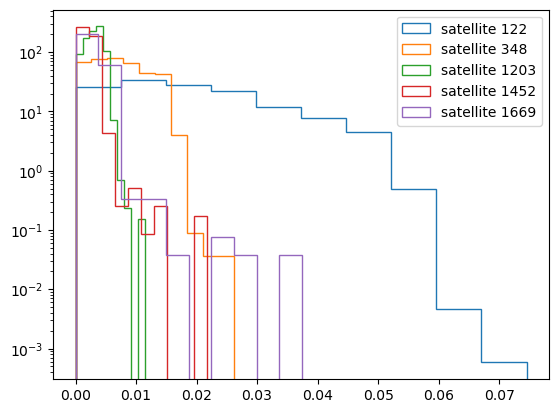

In [ ]:
for l in [0]:
    # plt.hist(hosts[l]['stellar_metal_00'][:])
    for i,sat in enumerate(sats[0]): 
        plt.hist(sat['stellar_metal'][:], histtype='step', log=True, density=True, label = f'satellite {sat_obj_ids[l][i]}')
# plt.hist(hosts[l]['stellar_metal_05'][:], histtype='step', log=True, density=True)
plt.legend()
plt.show()

In [ ]:
indices[0]

[(array([      0,       7,       8, ..., 1988023, 1988027, 1988029]),),
 (array([    185,   38576,   38577, ..., 1865442, 1865479, 1865559]),),
 (array([  91665,   91668,   91670, ..., 1938258, 1938289, 1938292]),),
 (array([  36329,  112107,  112229, ..., 1920673, 1937762, 1937763]),),
 (array([  21809,   32782,   34129, ..., 1938688, 1938690, 1964807]),)]

In [ ]:
print(type(indices))
print(len(indices))
print(indices[0])  # what's inside this?

<class 'list'>
3
[(array([      0,       7,       8, ..., 1988023, 1988027, 1988029]),), (array([    185,   38576,   38577, ..., 1865442, 1865479, 1865559]),), (array([  91665,   91668,   91670, ..., 1938258, 1938289, 1938292]),), (array([  36329,  112107,  112229, ..., 1920673, 1937762, 1937763]),), (array([  21809,   32782,   34129, ..., 1938688, 1938690, 1964807]),)]


In [ ]:
y_true = []

for i in [0, 1, 2]:
    # Unpack arrays from the singleton tuples
    gt_clusters_raw = indices[i]  # You mentioned indices[0] contains the clusters
    gt_clusters = [t[0] for t in gt_clusters_raw]  # extract the arrays from (array(...),)

    # label array
    n_points = max(idx for cluster in gt_clusters for idx in cluster) + 1
    y_true.append(np.full(n_points, -1, dtype=int))

    for cluster_label, cluster_indices in enumerate(gt_clusters):
        y_true[i][cluster_indices] = cluster_label

    print(len(y_true[i]))

1988030
1015175
1689489


In [ ]:
# import numpy as np

# # Example: Get indices where the label is 0
# label_of_interest = 0
# indices_with_label_0 = np.where(np.array(y_true[0]) == label_of_interest)[0]

# # Now get the corresponding stellar IDs from hosts[0]['stellar_id']
# stellar_ids_with_label_0 = hosts[0]['stellar_id'][indices_with_label_0]

# len(stellar_ids_with_label_0)

In [ ]:
for cluster in set(y_true[0]):
    print(cluster)
    


# Save
with open('./gt_cluster_labels_25.pkl', 'wb') as f:
    pickle.dump(hosts[0]y_true[0], f)

SyntaxError: invalid syntax. Perhaps you forgot a comma? (1868596925.py, line 8)

In [ ]:
# imported_data = np.load('/Users/benjaminhanf/Desktop/pomona_s25/thesis/pipeline/to_green_planet/25/savez_arrays_25.npz')

# import_ids = imported_data['ids'][:]
# jp = imported_data['jp'][:]
# jr = imported_data['jr'][:]
# jz = imported_data['jz'][:]

# print(len(import_ids), len(jp), len(jr), len(jz))

# plt.scatter(jp, jr, s=0.1)



In [ ]:
sat_obj_ids

In [ ]:
# #all else
# sumof = np.zeros(len(isinlist[0]))
# for list in isinlist:
#     sumof += list
# others = (-1 * sumof.astype(int)) + 1
# print(sum(others))
# isinlist.append(others)
    
for j,list in enumerate(isinlist):
    plt.scatter(jp[list], jr[list], s=0.5)
    plt.title(str(sat_obj_ids[0][j]))
    plt.xlim(-10, 10)
    plt.ylim(-10, 1800)
    plt.show()

In [ ]:
for list in isinlist:
    plt.hexbin(jp[list], jr[list], bins='log', cmap="Greys")
    plt.xlim(-10, 10)
    plt.ylim(-10, 1800)
    plt.show()

In [ ]:

for j,sat_group in enumerate(sats): #j 0,1,2
    for i,sat_object in enumerate(sat_group):
        x = hosts[j]['stellar_x'][:][indices[j][i]]
        y = hosts[j]['stellar_y'][:][indices[j][i]]
        plt.scatter(x,y, label = str(sat_obj_ids[j][i]) + str(", M = " + str('{:.2e}'.format((round(sat_masses[j][i], 5))))), s=1, linewidths=0, zorder = 2)
    plt.scatter(hosts[j]['stellar_x'][::1], hosts[j]['stellar_y'][::1], color = 'black',s=1,zorder=-1, linewidths=0)
    plt.xlabel("X (kpc)")
    plt.ylabel("Y (kpc)")
    plt.legend(title = "Satellite ID, Mass ($M_\odot$)", markerscale=5, loc='upper right')
    plt.title("Host ID: " + str(host_ids[j]) + str(", Mvir = " + str('{:.2e}'.format((round(host_masses[j], 5))))) + " $M_\odot$")
    plt.tight_layout()
    plt.savefig("./satellite_streams_host_" + str(host_ids[j]) + ".png", dpi = 500)
    plt.show((6,6))

In [ ]:
imported_data = np.load('/Users/benjaminhanf/Desktop/pomona_s25/thesis/pipeline/to_green_planet/25/savez_arrays_25.npz')

len(imported_data['ids'][:][0])